# **INTODUCTION TO MACHINE LEARNING FINAL PROJECT**

**Introduction**

In this project, the goal is to predict whether it will rain tomorrow or not 

**Import Libraries**

In [1]:
import numpy as np
import pandas as pd
from scipy import interp
import matplotlib.pyplot as plt #Visualisation
import seaborn as sns #Visualisation
from sklearn.model_selection import train_test_split, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import auc, roc_curve, confusion_matrix, accuracy_score, classification_report
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import SelectKBest, f_classif

**Read data**

In [2]:
#read from train file
df = pd.read_csv("train.csv")

## **I. Data exploration**

In [3]:
df.head()

,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,Feature_9,...,Feature_16,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label
0,0.896902,6.084509,0.6,80.0,76.0,D,a21,1.107143,0.692857,5,...,13.9,12.2,D,D,28.0,7.0,2011,40.0,10.693188,1
1,2.632690,23.441093,6.4,43.0,64.0,N,a9,1.700000,0.614286,11,...,18.6,16.5,N,I,61.0,43.0,2012,110.0,57.225409,0
2,1.133413,5.994495,0.4,63.0,100.0,C,a4,1.242857,0.428571,6,...,16.5,9.6,M,NaN,15.0,7.0,2012,0.0,146.400294,0
3,2.387702,18.165247,4.2,65.0,71.0,K,a15,1.050000,0.671429,10,...,14.2,11.4,K,D,39.0,24.0,2010,130.0,217.614788,0
4,2.101356,16.652846,3.2,40.0,62.0,F,a1,1.950000,1.085714,3,...,26.6,23.4,C,NaN,30.0,20.0,2011,0.0,81.490780,0


In [4]:
print(df.columns)
print(len(df.columns))

Index(['Feature_0', 'Feature_1', 'Evaporation', 'Feature_3', 'Feature_4',
       'Feature_5', 'Feature_6', 'MaxTemp', 'Feature_8', 'Feature_9',
       'Feature_10', 'Feature_11', 'Feature_12', 'Feature_13', 'Feature_14',
       'Sunshine', 'Feature_16', 'Feature_17', 'Feature_18', 'Feature_19',
       'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23', 'Feature_24',
       'label'],
      dtype='object')
26


In [5]:
df.head().shape

(5, 26)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22161 entries, 0 to 22160
Data columns (total 26 columns):
Feature_0        22161 non-null float64
Feature_1        22161 non-null float64
Evaporation      22161 non-null float64
Feature_3        22102 non-null float64
Feature_4        22057 non-null float64
Feature_5        20812 non-null object
Feature_6        22161 non-null object
MaxTemp          22154 non-null float64
Feature_8        22143 non-null float64
Feature_9        22161 non-null int64
Feature_10       22161 non-null float64
Feature_11       22055 non-null float64
Feature_12       22048 non-null float64
Feature_13       22161 non-null object
Feature_14       22161 non-null object
Sunshine         20290 non-null float64
Feature_16       22133 non-null float64
Feature_17       22109 non-null float64
Feature_18       21951 non-null object
Feature_19       21141 non-null object
WindGustSpeed    20816 non-null float64
Feature_21       22062 non-null float64
Year             22

> We can see that our dataset includes both **numerical** and **categorical** variables. And there are also **missing values** in our dataset since the number of **non-null** values doesn't match the number of entries.

We create 2 variable called **`categorical`** and **`numerical`** to make it easier for inspecting the columns given their different characteristics.

In [7]:
# List of categorical variables
categorical = [i for i in df.columns if df[i].dtypes == 'O']
# List of numerical variables
numerical = [i for i in df.columns if i not in categorical]
print('categorical:', categorical, '\n', 'numerical: ', numerical)

categorical: ['Feature_5', 'Feature_6', 'Feature_13', 'Feature_14', 'Feature_18', 'Feature_19'] 
 numerical:  ['Feature_0', 'Feature_1', 'Evaporation', 'Feature_3', 'Feature_4', 'MaxTemp', 'Feature_8', 'Feature_9', 'Feature_10', 'Feature_11', 'Feature_12', 'Sunshine', 'Feature_16', 'Feature_17', 'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23', 'Feature_24', 'label']


Let's remove non-numeric characters from numeric columns

In [8]:
df['Feature_6'] = df['Feature_6'].str.replace(r'[^0-9]+', '')
df['Feature_14'] = df['Feature_14'].str.replace(r'[^0-9]+', '')
df.head(19)

,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,Feature_9,...,Feature_16,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label
0,0.896902,6.084509,0.6,80.0,76.0,D,21,1.107143,0.692857,5,...,13.9,12.2,D,D,28.0,7.0,2011,40.0,10.693188,1
1,2.632690,23.441093,6.4,43.0,64.0,N,9,1.700000,0.614286,11,...,18.6,16.5,N,I,61.0,43.0,2012,110.0,57.225409,0
2,1.133413,5.994495,0.4,63.0,100.0,C,4,1.242857,0.428571,6,...,16.5,9.6,M,NaN,15.0,7.0,2012,0.0,146.400294,0
3,2.387702,18.165247,4.2,65.0,71.0,K,15,1.050000,0.671429,10,...,14.2,11.4,K,D,39.0,24.0,2010,130.0,217.614788,0
4,2.101356,16.652846,3.2,40.0,62.0,F,1,1.950000,1.085714,3,...,26.6,23.4,C,NaN,30.0,20.0,2011,0.0,81.490780,0
5,2.146114,19.073441,4.8,59.0,56.0,B,28,1.364286,0.657143,11,...,17.5,14.9,L,A,37.0,17.0,2012,110.0,55.925438,0
6,2.600014,19.629751,4.8,87.0,91.0,M,18,1.514286,1.271429,5,...,20.3,19.4,F,K,13.0,7.0,2010,40.0,76.565517,1
7,1.835036,18.066070,5.0,70.0,86.0,E,12,1.678571,1.500000,12,...,22.2,21.2,N,E,65.0,20.0,2010,370.0,604.163981,1
8,2.063235,17.791402,3.6,37.0,68.0,O,29,1.364286,0.307143,5,...,18.5,11.3,O,B,43.0,20.0,2011,90.0,182.906302,0
9,3.637301,41.605813,12.2,36.0,36.0,D,26,2.364286,1.314286,1,...,30.1,27.6,K,P,50.0,30.0,2010,90.0,321.145932,0


Let's check how many null values are there in each variable

In [9]:
df[numerical].isnull().sum()

Feature_0           0
Feature_1           0
Evaporation         0
Feature_3          59
Feature_4         104
MaxTemp             7
Feature_8          18
Feature_9           0
Feature_10          0
Feature_11        106
Feature_12        113
Sunshine         1871
Feature_16         28
Feature_17         52
WindGustSpeed    1345
Feature_21         99
Year                0
Feature_23        100
Feature_24        100
label               0
dtype: int64

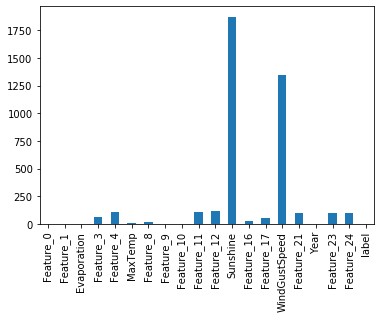

In [10]:
df[numerical].isnull().sum().plot.bar()
plt.show()

> As can be seen, **`Sunshine`** and **`WindGustSpeed`** are the ones with the highest number of missing values in numerical segment.

In [11]:
round(df[numerical].isnull().sum() / 22161, 3)

Feature_0        0.000
Feature_1        0.000
Evaporation      0.000
Feature_3        0.003
Feature_4        0.005
MaxTemp          0.000
Feature_8        0.001
Feature_9        0.000
Feature_10       0.000
Feature_11       0.005
Feature_12       0.005
Sunshine         0.084
Feature_16       0.001
Feature_17       0.002
WindGustSpeed    0.061
Feature_21       0.004
Year             0.000
Feature_23       0.005
Feature_24       0.005
label            0.000
dtype: float64

> Approximately 8% values of **`Sunshine`** is missing while the rate for **`WindGustSpeed`** is at around 6%. These are pretty low precenages.

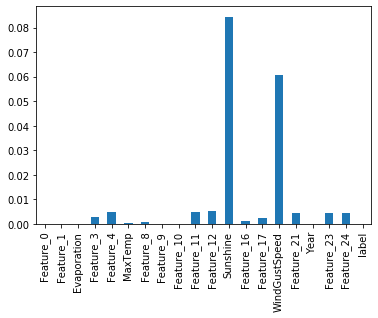

In [12]:
(df[numerical].isnull().sum() / 22161).plot.bar()
plt.show()

Similarly, we calculate and plot the number of missing values in categorical variables

In [13]:
df[categorical].isnull().sum()

Feature_5     1349
Feature_6        0
Feature_13       0
Feature_14       0
Feature_18     210
Feature_19    1020
dtype: int64

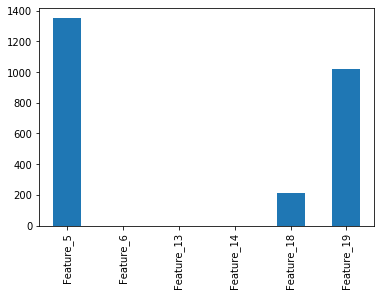

In [14]:
df[categorical].isnull().sum().plot.bar()
plt.show()

In [15]:
round(df[categorical].isnull().sum() / 22161, 3)

Feature_5     0.061
Feature_6     0.000
Feature_13    0.000
Feature_14    0.000
Feature_18    0.009
Feature_19    0.046
dtype: float64

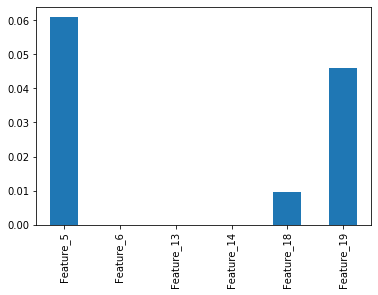

In [16]:
(df[categorical].isnull().sum() / 22161).plot.bar()
plt.show()

> The missing rate in categorical variable is not much since the highest one is around ***6%*** of **`Feature_5`**.

Let's inspect the distribution of numerical variables.

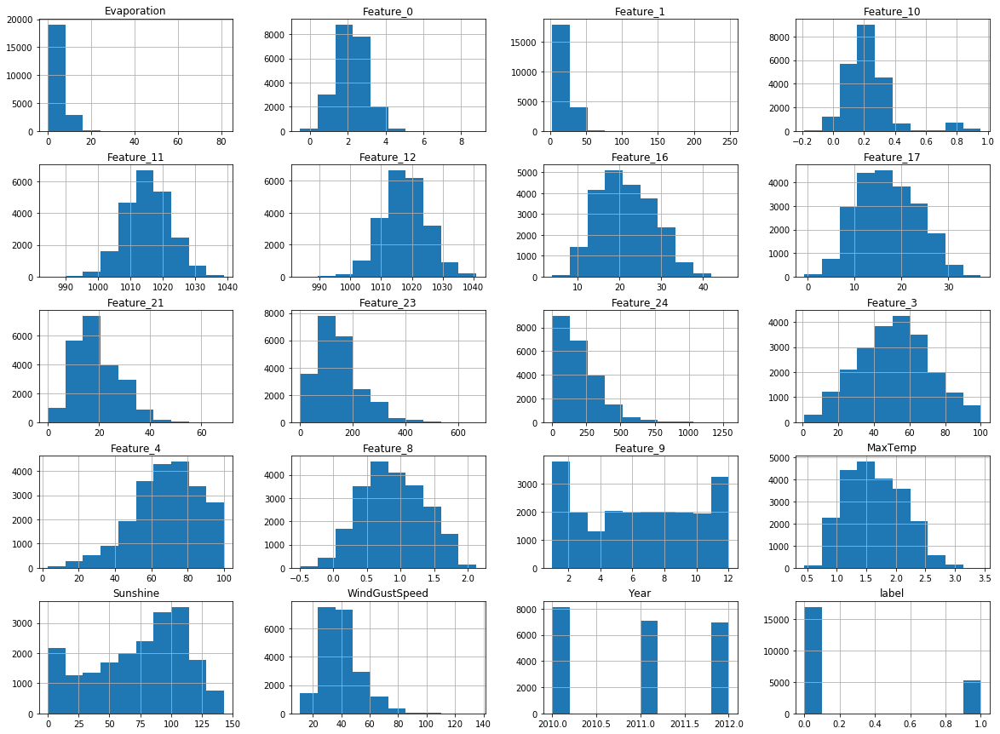

In [17]:
df[numerical].hist(bins=10, figsize = (20,15))
plt.show()

> The histograms show us that some variables follow normal distribution, for example **`Feature_3`**, **`Feature_11`** while some are highly skewed, namely **`WindGustSpeed`**, **`Feature_23`**, **`Feature_24`**. We will process these values later before using them for the model.

Some descriptive statistics about categorical variables

In [18]:
df[categorical].describe()

,Feature_5,Feature_6,Feature_13,Feature_14,Feature_18,Feature_19
count,20812,22161,22161,22161,21951,21141
unique,16,31,3,315,16,16
top,D,6,0,00,D,E
freq,1604,786,16906,13816,1659,1861


> From the summary table, we can see the most frequent values of each variable and its frequency in the dataset. 

Let's see the values of the binary-class variable **label**. 

In [19]:
print(df['label'].value_counts())

0    16921
1     5240
Name: label, dtype: int64


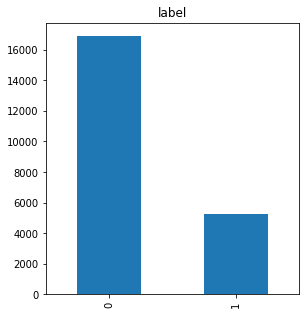

In [20]:
%matplotlib inline
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
df['label'].value_counts().plot.bar()
plt.title('label')
plt.show()

> As we can see, in our target variable **label**, there is a big difference between the number of yes-no values. We have to take this into consideration when sampling to avoid biasness in the model.

Let's have a look at some statistics of the dataset

In [21]:
df[numerical].describe()

,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,MaxTemp,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Sunshine,Feature_16,Feature_17,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label
count,22161.000000,22161.000000,22161.000000,22102.000000,22057.000000,22154.000000,22143.000000,22161.000000,22161.000000,22055.000000,22048.000000,20290.000000,22133.000000,22109.000000,20816.000000,22062.000000,22161.000000,22061.000000,22061.000000,22161.000000
mean,2.188605,19.782469,4.929620,51.547009,68.497982,1.648476,0.888041,6.429358,0.227859,1015.347014,1017.708572,73.685017,21.617133,17.065837,39.995484,19.101577,2010.945264,146.971579,191.782875,0.236451
std,0.816631,10.772055,3.572644,20.184353,18.231315,0.480275,0.461375,3.381488,0.159533,7.011856,7.085807,37.866780,6.602743,6.409174,13.150807,8.546933,0.823740,86.609704,148.833906,0.424912
min,-0.534231,2.776724,0.000000,1.000000,3.000000,0.450000,-0.492857,1.000000,-0.185658,984.500000,983.700000,0.000000,3.900000,-0.700000,11.000000,0.000000,2010.000000,0.000000,0.021012,0.000000
25%,1.627396,12.206173,2.400000,37.000000,57.000000,1.271429,0.542857,3.000000,0.136382,1010.600000,1013.000000,45.000000,16.500000,12.100000,31.000000,13.000000,2010.000000,90.000000,76.693088,0.000000
50%,2.170449,17.848944,4.200000,52.000000,69.000000,1.607143,0.864286,7.000000,0.206442,1015.300000,1017.700000,82.000000,21.000000,16.600000,39.000000,19.000000,2011.000000,130.000000,162.384678,0.000000
75%,2.718441,25.147043,6.600000,65.000000,82.000000,2.007143,1.242857,9.000000,0.280474,1020.000000,1022.400000,104.000000,26.400000,21.800000,48.000000,24.000000,2012.000000,200.000000,273.166651,0.000000
max,8.805001,248.339743,81.200000,100.000000,100.000000,3.435714,2.128571,12.000000,0.954180,1038.900000,1040.900000,143.000000,46.100000,36.900000,135.000000,69.000000,2012.000000,670.000000,1289.931375,1.000000


> The table shows that variables are of **different ranges**

Let's draw boxplots to inspect the **range** of the data and **anomalies**.

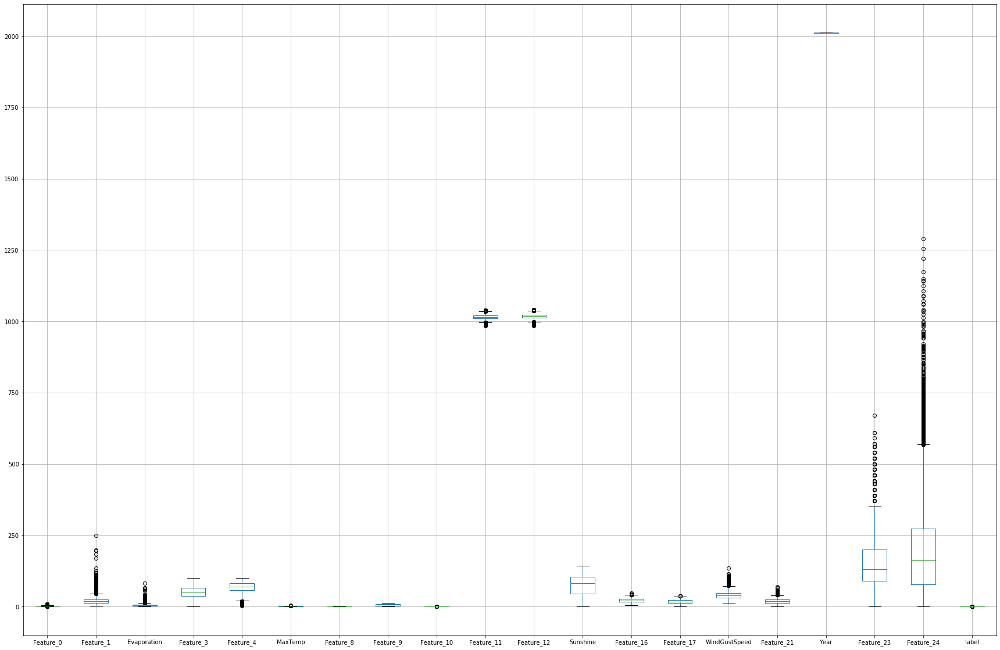

In [22]:
df[numerical].boxplot(figsize=(30,20))
plt.show()

> The boxplots reveal a great number of outliers in **`Feature_1`**, **`Evaporation`**, **`WindGustSpeed`**, **`Feature_23`** and **`Feature_24`**

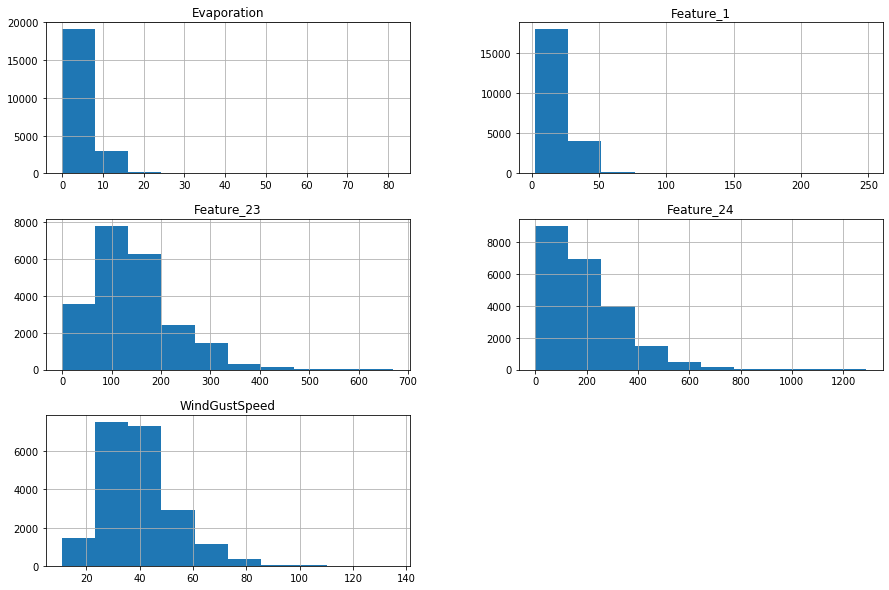

In [23]:
outlier = ['Feature_1', 'Evaporation', 'WindGustSpeed', 'Feature_23', 'Feature_24']
df[outlier].hist(bins=10, figsize=(15,10))
plt.show()

Let's draw a heatmap to see the correlation between variables

(20.0, 0.0)

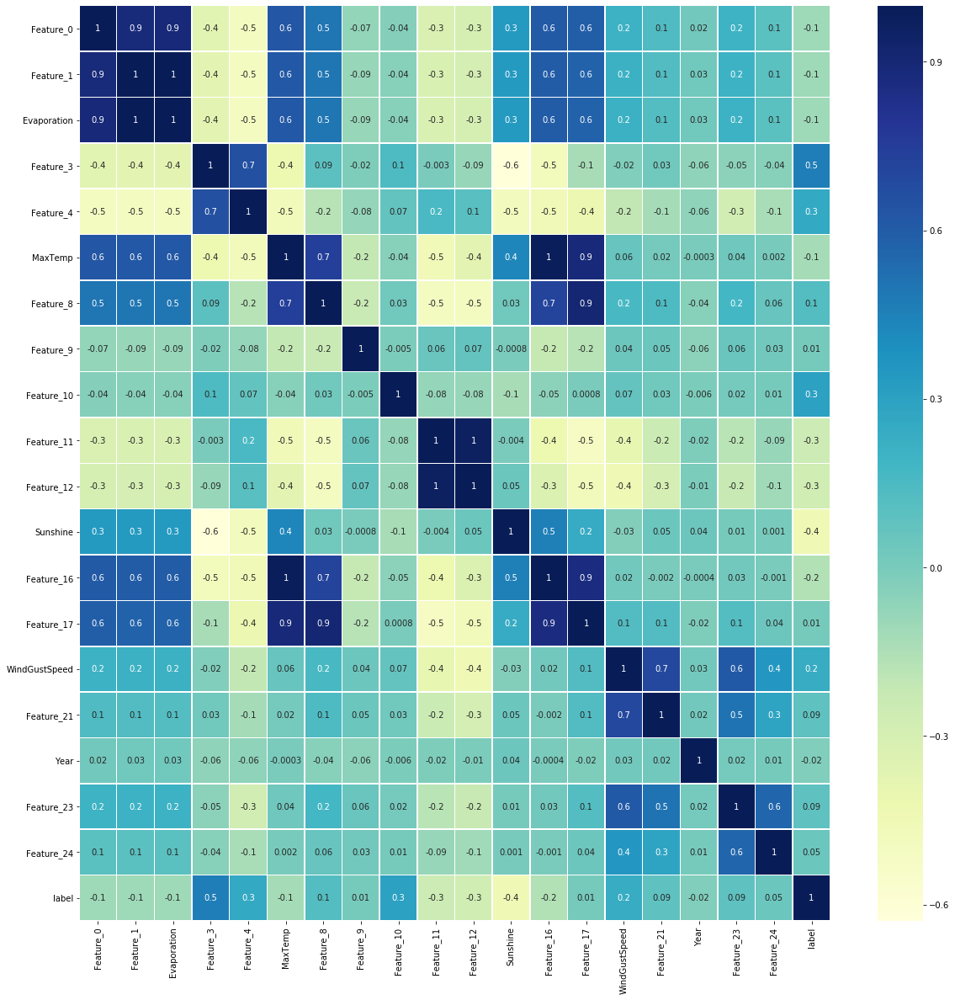

In [24]:
fig, ax = plt.subplots(figsize=(20,20))
cm = sns.heatmap(df.corr(), linewidths = .5, cmap="YlGnBu", annot=True, ax=ax, fmt='.1g')
bottom,top = ax.get_ylim()
ax.set_ylim(bottom+0.5,top-0.5)

> From this heatmap, we can see blocks of **highly correlated** variables along the main diagonal.

## **II. Data Preprocessing and Preparation**

In this part, we will prepare the data to better expose the underlying data patterns.

### ***1. Data cleaning***

In the data cleaning task, we will come to **remove outliers** and deal with **missing values**.

In this case, we will remove the outliers that initially detected in the boxplots. To determine whether a datapoint is outlier or not, we will calculate the **interquartile method**.

An interquartile will be calculated by the formula: **IQR = Q3 - Q1**

In [25]:
IQR_o = df[outlier].quantile(0.75) - df[outlier].quantile(0.25)
print(IQR_o)

Feature_1         12.940870
Evaporation        4.200000
WindGustSpeed     17.000000
Feature_23       110.000000
Feature_24       196.473564
dtype: float64


We then iterately compute the **upper bound** and **lower bound** of each variable.

In [26]:
# Let's find outliers values of Feature_1
upb_rf = round(df['Feature_1'].quantile(0.25) - 1.5*IQR_o[0], 3)
lob_rf = round(df['Feature_1'].quantile(0.75) + 1.5*IQR_o[0], 3)
print('Upper bound is:', upb_rf)
print('Lower bound is:', lob_rf)

Upper bound is: -7.205
Lower bound is: 44.558


In [27]:
# Let's find outliers values of Evaporation
upb_ev = round(df['Evaporation'].quantile(0.25) - 1.5*IQR_o[1], 3)
lob_ev = round(df['Evaporation'].quantile(0.75) + 1.5*IQR_o[1], 3)
print('Upper bound is:', upb_ev)
print('Lower bound is:', lob_ev)

Upper bound is: -3.9
Lower bound is: 12.9


In [28]:
# Let's find outliers values of WindGustSpeed
upb_wg = round(df['WindGustSpeed'].quantile(0.25) - 1.5*IQR_o[2], 3)
lob_wg = round(df['WindGustSpeed'].quantile(0.75) + 1.5*IQR_o[2], 3)
print('Upper bound is:', upb_wg)
print('Lower bound is:', lob_wg)

Upper bound is: 5.5
Lower bound is: 73.5


In [29]:
# Let's find outliers values of Feature_23
upb_wg = round(df['Feature_23'].quantile(0.25) - 1.5*IQR_o[2], 3)
lob_wg = round(df['Feature_23'].quantile(0.75) + 1.5*IQR_o[2], 3)
print('Upper bound is:', upb_wg)
print('Lower bound is:', lob_wg)

Upper bound is: 64.5
Lower bound is: 225.5


In [30]:
# Let's find outliers values of Feature_24
upb_wg = round(df['Feature_24'].quantile(0.25) - 1.5*IQR_o[2], 3)
lob_wg = round(df['Feature_24'].quantile(0.75) + 1.5*IQR_o[2], 3)
print('Upper bound is:', upb_wg)
print('Lower bound is:', lob_wg)

Upper bound is: 51.193
Lower bound is: 298.667


Let's look at the statistics of these variable again.

In [31]:
df[outlier].describe()

,Feature_1,Evaporation,WindGustSpeed,Feature_23,Feature_24
count,22161.000000,22161.000000,20816.000000,22061.000000,22061.000000
mean,19.782469,4.929620,39.995484,146.971579,191.782875
std,10.772055,3.572644,13.150807,86.609704,148.833906
min,2.776724,0.000000,11.000000,0.000000,0.021012
25%,12.206173,2.400000,31.000000,90.000000,76.693088
50%,17.848944,4.200000,39.000000,130.000000,162.384678
75%,25.147043,6.600000,48.000000,200.000000,273.166651
max,248.339743,81.200000,135.000000,670.000000,1289.931375


> As we can see:
1. The minimum of **Feature_1** is 2.777 and maximum is 248.4, therefore, the outliers will be values that ***> 44.558***
2. Similarly, the outliers values in **Evaporation** will be ***> 12.9***
3. The outliers in **WindGustSpeed** will be values that are ***> 73.5***
4. For **Feature_23**, the outlier values will be ***> 225.5***
5. And the outliers in **Feature_24** will be ***> 298.667***

Let's come back to our dataset and get rid of these values

In [32]:
df = df[~((df ['Feature_1'] > 44.558) |(df['Evaporation'] > 12.9) | (df['WindGustSpeed'] > 73.5) | (df['Feature_23'] > 225.5) | (df['Feature_24'] > 298.667))]
df.describe()

,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,MaxTemp,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Sunshine,Feature_16,Feature_17,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label
count,15727.000000,15727.000000,15727.000000,15682.000000,15643.000000,15721.000000,15713.000000,15727.000000,15727.000000,15642.000000,15633.000000,14304.000000,15705.000000,15687.000000,14697.000000,15639.000000,15727.000000,15633.000000,15633.000000,15727.000000
mean,2.091095,18.237555,4.417766,52.400077,70.656971,1.635485,0.856062,6.392128,0.227164,1015.911661,1018.407446,73.459732,21.468201,16.727398,36.378104,17.372658,2010.936669,113.974285,127.360391,0.222039
std,0.745021,8.297047,2.741776,19.544158,17.472526,0.465375,0.468723,3.309281,0.157806,6.961459,6.981568,37.533268,6.371711,6.448618,10.576805,7.534217,0.823434,58.228594,81.456961,0.415630
min,-0.534231,2.776724,0.000000,1.000000,5.000000,0.450000,-0.492857,1.000000,-0.185658,986.200000,987.300000,0.000000,4.300000,-0.700000,11.000000,0.000000,2010.000000,0.000000,0.021012,0.000000
25%,1.565619,11.600151,2.200000,39.000000,60.000000,1.264286,0.507143,3.000000,0.136551,1011.100000,1013.600000,45.000000,16.400000,11.800000,30.000000,11.000000,2010.000000,70.000000,57.505486,0.000000
50%,2.093165,17.011821,4.000000,53.000000,71.000000,1.600000,0.828571,6.000000,0.206425,1015.800000,1018.300000,82.000000,21.000000,16.300000,35.000000,17.000000,2011.000000,110.000000,119.101405,0.000000
75%,2.615780,23.684023,6.200000,65.000000,84.000000,1.992857,1.214286,9.000000,0.280682,1020.600000,1023.100000,103.000000,26.200000,21.500000,43.000000,22.000000,2012.000000,170.000000,191.599818,0.000000
max,4.475665,44.506372,12.800000,100.000000,100.000000,3.164286,2.050000,12.000000,0.954180,1038.900000,1040.900000,143.000000,43.300000,36.400000,72.000000,54.000000,2012.000000,220.000000,298.626352,1.000000


In [33]:
df[outlier].describe()

,Feature_1,Evaporation,WindGustSpeed,Feature_23,Feature_24
count,15727.000000,15727.000000,14697.000000,15633.000000,15633.000000
mean,18.237555,4.417766,36.378104,113.974285,127.360391
std,8.297047,2.741776,10.576805,58.228594,81.456961
min,2.776724,0.000000,11.000000,0.000000,0.021012
25%,11.600151,2.200000,30.000000,70.000000,57.505486
50%,17.011821,4.000000,35.000000,110.000000,119.101405
75%,23.684023,6.200000,43.000000,170.000000,191.599818
max,44.506372,12.800000,72.000000,220.000000,298.626352


> Now that the statitics have changed, let's see if we finally get rid of the outliers.

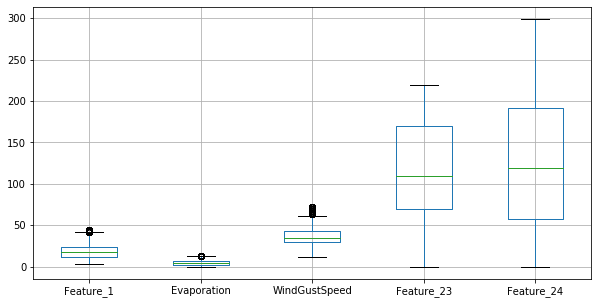

In [34]:
df[outlier].boxplot(figsize = (10,5))
plt.show()

> We can still spot some outliers here, but not many. Why? 
Because after removing outliers, the statistics values of the dataset will change. In this case we are using **interquartile (IQR)**, which means we are using **median** values. The median values will change a little and not much affected by the removed outliers. That's why the new **range**, in other words, **upper bound** and **lower bound** will slightly change.

Now that we get rid of outliers, let's handle missing values. Let's have a look again at the number of missing values!

In [35]:
df[numerical].isnull().sum()

Feature_0           0
Feature_1           0
Evaporation         0
Feature_3          45
Feature_4          84
MaxTemp             6
Feature_8          14
Feature_9           0
Feature_10          0
Feature_11         85
Feature_12         94
Sunshine         1423
Feature_16         22
Feature_17         40
WindGustSpeed    1030
Feature_21         88
Year                0
Feature_23         94
Feature_24         94
label               0
dtype: int64

In [36]:
df[categorical].isnull().sum()

Feature_5     1033
Feature_6        0
Feature_13       0
Feature_14       0
Feature_18     182
Feature_19     945
dtype: int64

> As you can see, we have missing values in both numerical and categorical values so first we will handle categorical attributes and then numerical. After that, we will create a pipeline for feature engineering.

To fill missing values in numerical variables, we will replace missing values with the mean value of that feature.

In [37]:
df.loc[:, numerical] = df.loc[:, numerical].fillna(df.mean())

Similarly, we use the **most frequent** value to fill in the place of missing values in categorical variables.

In [38]:
df.loc[:, categorical] = df.loc[:, categorical].fillna(df.mode().iloc[0])

In [39]:
df.isnull().sum()

Feature_0        0
Feature_1        0
Evaporation      0
Feature_3        0
Feature_4        0
Feature_5        0
Feature_6        0
MaxTemp          0
Feature_8        0
Feature_9        0
Feature_10       0
Feature_11       0
Feature_12       0
Feature_13       0
Feature_14       0
Sunshine         0
Feature_16       0
Feature_17       0
Feature_18       0
Feature_19       0
WindGustSpeed    0
Feature_21       0
Year             0
Feature_23       0
Feature_24       0
label            0
dtype: int64

> Now that there is no missing values in our dataset, let's move on to **feature selection** task

### ***2. Feature Selection***
In this part, we will deal with highly correlated variables

Let's have a look at the correlation matrix again:

(20.0, 0.0)

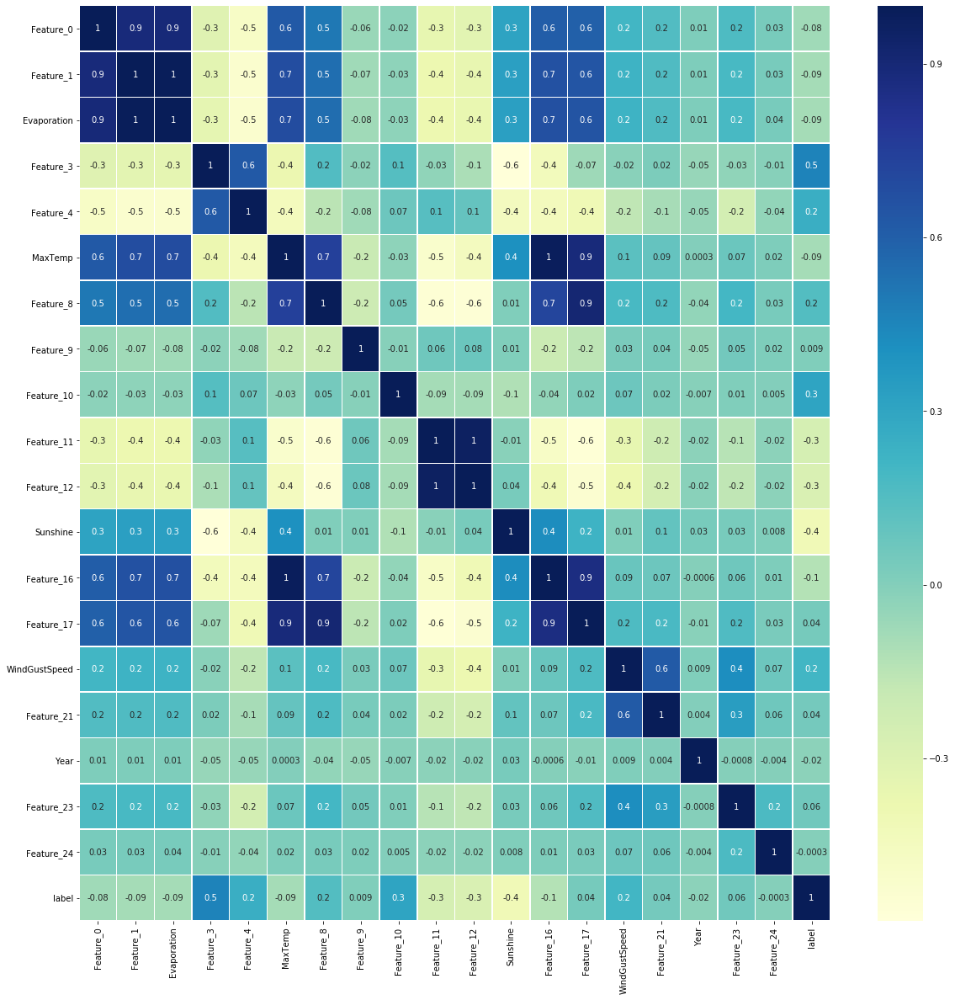

In [40]:
fig, ax = plt.subplots(figsize=(20,20))
cm = sns.heatmap(df.corr(), linewidths = .5, cmap="YlGnBu", annot=True, ax=ax, fmt='.1g')
bottom,top = ax.get_ylim()
ax.set_ylim(bottom+0.5,top-0.5)

> As you can see, there's a perfect correlation between **`Feature_1`** and **`Evaporation`** and also between **`Feature_11`** and **`Feature_12`**, which mean the two variables represent the same information. Therefore, I will get rid of either of them, in this case, **`Feature_1`** and **`Feature_11`**

In [41]:
df.drop(labels='Feature_1', axis = 1, inplace= True)
df.drop(labels='Feature_11', axis = 1, inplace= True)
df.columns

Index(['Feature_0', 'Evaporation', 'Feature_3', 'Feature_4', 'Feature_5',
       'Feature_6', 'MaxTemp', 'Feature_8', 'Feature_9', 'Feature_10',
       'Feature_12', 'Feature_13', 'Feature_14', 'Sunshine', 'Feature_16',
       'Feature_17', 'Feature_18', 'Feature_19', 'WindGustSpeed', 'Feature_21',
       'Year', 'Feature_23', 'Feature_24', 'label'],
      dtype='object')

Since we want to see if there is any correlation between the season and the target variable, we will create new variable in the dataset by extracting corresponding data from Feature_9 variable which has values between 1 and 12 and I can guess indicates the month.

In [42]:
df_with_new_feature = df
df_with_new_feature['Season'] = df_with_new_feature['Feature_9'].replace((1,2,3,4,5,6,7,8,9,10,11,12), ('Winter', 'Winter', 'Spring', 'Spring', 'Spring', 'Summer', 'Summer', 'Summer', 'Autumn', 'Autumn', 'Autumn', 'Winter'))
df_with_new_feature.head()

,Feature_0,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,Feature_9,Feature_10,...,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label,Season
0,0.896902,0.6,80.0,76.0,D,21,1.107143,0.692857,5,0.247710,...,12.2,D,D,28.0,7.0,2011,40.0,10.693188,1,Spring
1,2.632690,6.4,43.0,64.0,N,9,1.700000,0.614286,11,0.076223,...,16.5,N,I,61.0,43.0,2012,110.0,57.225409,0,Autumn
2,1.133413,0.4,63.0,100.0,C,4,1.242857,0.428571,6,0.163827,...,9.6,M,E,15.0,7.0,2012,0.0,146.400294,0,Summer
3,2.387702,4.2,65.0,71.0,K,15,1.050000,0.671429,10,0.156669,...,11.4,K,D,39.0,24.0,2010,130.0,217.614788,0,Autumn
4,2.101356,3.2,40.0,62.0,F,1,1.950000,1.085714,3,0.222553,...,23.4,C,E,30.0,20.0,2011,0.0,81.490780,0,Spring


> Now the data already have the features that we want and **`Feature_9`** variable is of no use, we will get rid of this variable by **dropping** it.

In [43]:
df_with_new_feature.drop(labels='Feature_9', axis = 1, inplace = True)
# List of categorical variables because we added season variable
categorical_with_new_feature = [i for i in df_with_new_feature.columns if df_with_new_feature[i].dtypes == 'O']
# List of numerical variables
numerical_with_new_feature = [i for i in df_with_new_feature.columns if i not in categorical]
print('categorical:', categorical_with_new_feature, '\n', 'numerical: ', numerical_with_new_feature)

categorical: ['Feature_5', 'Feature_6', 'Feature_13', 'Feature_14', 'Feature_18', 'Feature_19', 'Season'] 
 numerical:  ['Feature_0', 'Evaporation', 'Feature_3', 'Feature_4', 'MaxTemp', 'Feature_8', 'Feature_10', 'Feature_12', 'Sunshine', 'Feature_16', 'Feature_17', 'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23', 'Feature_24', 'label', 'Season']


We plot the correlation matrix again to see the new values.

(17.0, 0.0)

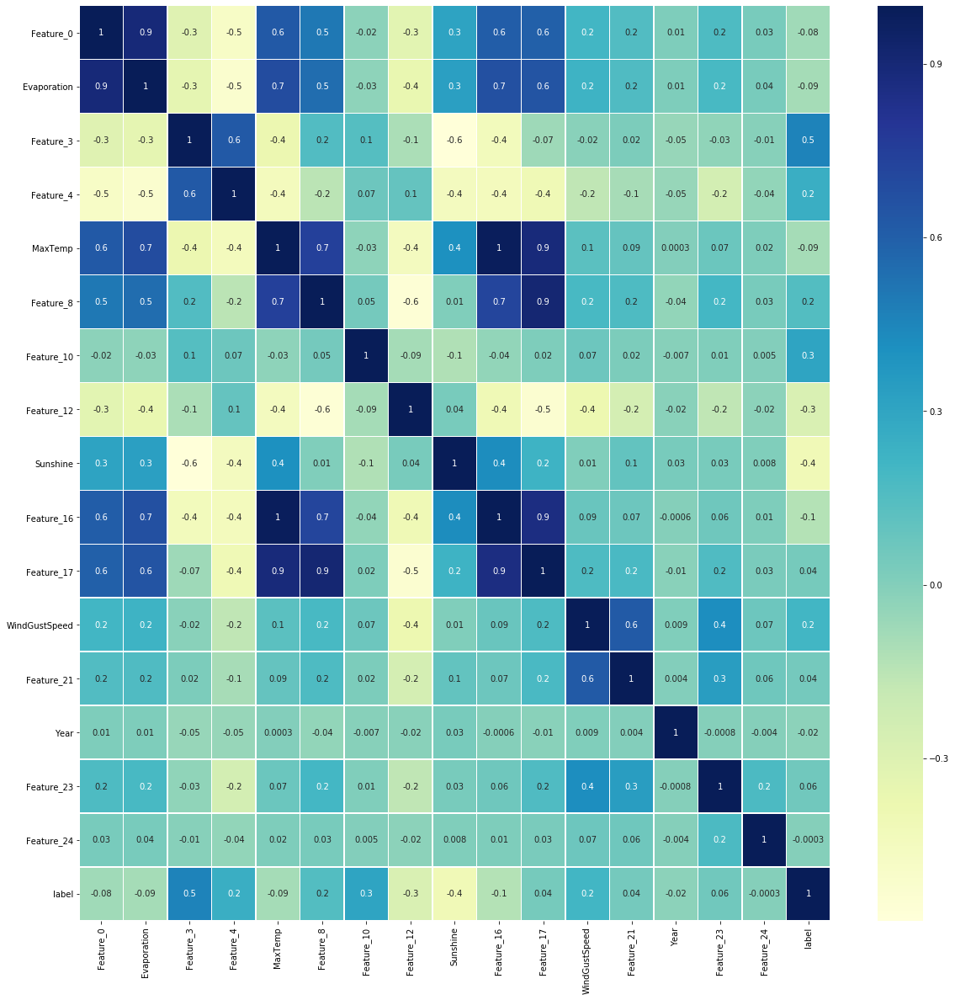

In [44]:
fig, ax = plt.subplots(figsize=(20,20))
cm = sns.heatmap(df_with_new_feature.corr(), linewidths = .5, cmap="YlGnBu", annot=True, ax=ax, fmt='.1g')
bottom,top = ax.get_ylim()
ax.set_ylim(bottom+0.5,top-0.5)

### ***3. Feature engineering***
Since Machine learning algorithms require input and target variables to be **numerical** so in this part, we will transform our **categorical** values into **numeric** ones. 

We will make use of the LabelEncode function from scikit-learn. This function basically assigns values between 0 and number of classes - 1.

For example, [A, B, C] will be decoded as [0, 1, 2].

In [45]:
categorical = [i for i in df.columns if df[i].dtypes == 'O']
lb_encoder = LabelEncoder()
#After calling the function, we will fit and transform the target labels.
for i in df[categorical].columns:
  df[i] = lb_encoder.fit_transform(df[i])
#print the result after transformation
for i in df[categorical]:
  print(i, ':', df[i].unique())

Feature_5 : [ 3 13  2 10  5  1 12 14  8  4 15 11  9  7  0  6]
Feature_6 : [14 30 25  7  1 21 10 22  0 15 11 18 23  2  9 12  3 27 28 13  8 19  5 29
  4 24  6 26 16 17 20]
Feature_13 : [0 1 2]
Feature_14 : [  7   1   8 184   5   9  37 244 196   3  45 103  14  34 123 177 212 236
 260 240  91 143 202 217 190  57  69  21 252  55  43 104  65 112 133  67
 230  80 279  48 269 225  47  83  10  24 195 208 167 262 137 253 271  25
  59 152 135 276 149  71 163  42 204 187 157 278  49 265 153  62   0 175
 113 186  38  18 221 247  13 248 255  88 232 249  11 277 189  84 170  64
 146  27  53  79 172  33  41  39 118  56  81 169 235 168 122 174  22 159
  75 191  96  89 134 227  73  85  87 198 274  19 110  28  31  12  15 132
  50 206 211 246 272  74  54 205  20  95  23  16 124 275 130 125 121 203
 155  82  26  32  29  98  46  52 151 156 166 219   2 109 120 129 207  61
 101 216  94  66 199 192 111 119  58  68 154 148 114 165 238  92 164 117
  30 160 100 263  44 107 139 171 254  86 200 115 223 138  93 102 2

In [46]:
df.head()

,Feature_0,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,Feature_10,Feature_12,...,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label,Season
0,0.896902,0.6,80.0,76.0,3,14,1.107143,0.692857,0.247710,1025.9,...,12.2,3,3,28.0,7.0,2011,40.0,10.693188,1,1
1,2.632690,6.4,43.0,64.0,13,30,1.700000,0.614286,0.076223,1008.1,...,16.5,13,8,61.0,43.0,2012,110.0,57.225409,0,0
2,1.133413,0.4,63.0,100.0,2,25,1.242857,0.428571,0.163827,1026.5,...,9.6,12,4,15.0,7.0,2012,0.0,146.400294,0,2
3,2.387702,4.2,65.0,71.0,10,7,1.050000,0.671429,0.156669,1019.8,...,11.4,10,3,39.0,24.0,2010,130.0,217.614788,0,0
4,2.101356,3.2,40.0,62.0,5,1,1.950000,1.085714,0.222553,1007.8,...,23.4,2,4,30.0,20.0,2011,0.0,81.490780,0,1


In [47]:
categorical_with_new_feature = [i for i in df_with_new_feature.columns if df_with_new_feature[i].dtypes == 'O']
lb_encoder = LabelEncoder()
#After calling the function, we will fit and transform the target labels.
for i in df_with_new_feature[categorical_with_new_feature].columns:
  df_with_new_feature[i] = lb_encoder.fit_transform(df_with_new_feature[i])
#print the result after transformation
for i in df_with_new_feature[categorical_with_new_feature]:
  print(i, ':', df_with_new_feature[i].unique())

In [48]:
df_with_new_feature.head()

,Feature_0,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,Feature_10,Feature_12,...,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24,label,Season
0,0.896902,0.6,80.0,76.0,3,14,1.107143,0.692857,0.247710,1025.9,...,12.2,3,3,28.0,7.0,2011,40.0,10.693188,1,1
1,2.632690,6.4,43.0,64.0,13,30,1.700000,0.614286,0.076223,1008.1,...,16.5,13,8,61.0,43.0,2012,110.0,57.225409,0,0
2,1.133413,0.4,63.0,100.0,2,25,1.242857,0.428571,0.163827,1026.5,...,9.6,12,4,15.0,7.0,2012,0.0,146.400294,0,2
3,2.387702,4.2,65.0,71.0,10,7,1.050000,0.671429,0.156669,1019.8,...,11.4,10,3,39.0,24.0,2010,130.0,217.614788,0,0
4,2.101356,3.2,40.0,62.0,5,1,1.950000,1.085714,0.222553,1007.8,...,23.4,2,4,30.0,20.0,2011,0.0,81.490780,0,1


> We can see that our dataset now is purely numerical as required to apply ML algorithms.

We create a new variable to store only input features

In [49]:
input_variables = [i for i in df.columns if i != 'label']

In [50]:
input_variables_with_new_feature = [i for i in df_with_new_feature.columns if i != 'label']

### ***4. Feature scaling***
Since the the entries in our dataset are of different scales, we will scale them to a certain range.

In this project, we will use both **`StandardScaler`**, which redistributes the features with their mean μ = 0 and standard deviation σ = 1 and **`MinMaxScaler`**, which redistributes the features between 0 and 1. We will see which one is better later.

In [51]:
y = df['label']
dfs = ["without_new_feature","with_new_feature"]
scalars = [" minMaxScalar", " standardScalar"]
features = [" SelectKBest ", " pca "]
names = []
Xs = [df[input_variables],df_with_new_feature[input_variables_with_new_feature]]
Xs_scaled = []
i = 0
for x in Xs:
    scaler = MinMaxScaler()
    scaler.fit(x)
    Xs_scaled.append(scaler.transform(x))
    names.append(dfs[i]+scalars[0])
    i = i + 1
i = 0
for x in Xs:
    scaler = StandardScaler()
    Xs_scaled.append(scaler.fit_transform(x))
    names.append(dfs[i]+scalars[1])
    i = i + 1 

In [52]:
(pd.DataFrame(data = Xs_scaled[0])).describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,...,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000
mean,0.524028,0.345138,0.519193,0.691126,0.469960,0.497868,0.436758,0.530474,0.362176,0.580363,...,0.440210,0.469741,0.494822,0.478879,0.416034,0.321716,0.468335,0.518065,0.426447,0.488353
std,0.148710,0.214201,0.197133,0.183429,0.310339,0.293453,0.171421,0.184247,0.138446,0.129863,...,0.163263,0.173596,0.312899,0.303851,0.167616,0.139132,0.411717,0.263883,0.271975,0.362442
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.419141,0.171875,0.383838,0.578947,0.200000,0.266667,0.300000,0.393258,0.282680,0.490672,...,0.310256,0.336927,0.200000,0.266667,0.311475,0.203704,0.000000,0.318182,0.193352,0.333333
50%,0.524441,0.312500,0.525253,0.694737,0.466667,0.500000,0.423684,0.519663,0.343981,0.580224,...,0.428205,0.458221,0.533333,0.466667,0.416034,0.314815,0.500000,0.500000,0.400644,0.333333
75%,0.628758,0.484375,0.646465,0.831579,0.733333,0.733333,0.568421,0.668539,0.409128,0.667910,...,0.561538,0.598383,0.733333,0.733333,0.491803,0.407407,1.000000,0.772727,0.639432,0.666667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [53]:
(pd.DataFrame(data = Xs_scaled[1])).describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,...,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000,15727.000000
mean,0.524028,0.345138,0.519193,0.691126,0.469960,0.497868,0.436758,0.530474,0.362176,0.580363,...,0.440210,0.469741,0.494822,0.478879,0.416034,0.321716,0.468335,0.518065,0.426447,0.488353
std,0.148710,0.214201,0.197133,0.183429,0.310339,0.293453,0.171421,0.184247,0.138446,0.129863,...,0.163263,0.173596,0.312899,0.303851,0.167616,0.139132,0.411717,0.263883,0.271975,0.362442
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.419141,0.171875,0.383838,0.578947,0.200000,0.266667,0.300000,0.393258,0.282680,0.490672,...,0.310256,0.336927,0.200000,0.266667,0.311475,0.203704,0.000000,0.318182,0.193352,0.333333
50%,0.524441,0.312500,0.525253,0.694737,0.466667,0.500000,0.423684,0.519663,0.343981,0.580224,...,0.428205,0.458221,0.533333,0.466667,0.416034,0.314815,0.500000,0.500000,0.400644,0.333333
75%,0.628758,0.484375,0.646465,0.831579,0.733333,0.733333,0.568421,0.668539,0.409128,0.667910,...,0.561538,0.598383,0.733333,0.733333,0.491803,0.407407,1.000000,0.772727,0.639432,0.666667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [54]:
(pd.DataFrame(data = Xs_scaled[2])).describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,...,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04
mean,3.620032e-16,-2.832368e-16,-3.655681e-17,-7.566205e-16,-1.428246e-16,1.281342e-16,6.526716e-16,1.803486e-17,-4.542335e-17,-7.457604e-15,...,-1.385749e-17,4.806001e-16,1.960380e-16,1.425564e-16,-6.373053e-16,1.664911e-16,-1.360011e-13,-1.752623e-16,-2.491948e-17,-1.590484e-15
std,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,...,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00
min,-3.523939e+00,-1.611330e+00,-2.633800e+00,-3.767922e+00,-1.514395e+00,-1.696638e+00,-2.547946e+00,-2.879236e+00,-2.616096e+00,-4.469172e+00,...,-2.696414e+00,-2.706031e+00,-1.581462e+00,-1.576084e+00,-2.482150e+00,-2.312387e+00,-1.137552e+00,-1.963298e+00,-1.568015e+00,-1.347438e+00
25%,-7.053388e-01,-8.089050e-01,-6.866357e-01,-6.115823e-01,-8.699175e-01,-7.878891e-01,-7.978137e-01,-7.447601e-01,-5.742235e-01,-6.906804e-01,...,-7.960046e-01,-7.650995e-01,-9.422576e-01,-6.984326e-01,-6.238217e-01,-8.482323e-01,-1.137552e+00,-7.574922e-01,-8.570743e-01,-4.277229e-01
50%,2.778305e-03,-1.523753e-01,3.074079e-02,1.968574e-02,-1.061358e-02,7.266178e-03,-7.626800e-02,-5.867863e-02,-1.314262e-01,-1.069728e-03,...,-7.353503e-02,-6.636410e-02,1.230828e-01,-4.019384e-02,-6.949588e-16,-4.960264e-02,7.691274e-02,-6.846024e-02,-9.487562e-02,-4.277229e-01
75%,7.042770e-01,6.500499e-01,6.456349e-01,7.657298e-01,8.486903e-01,8.024215e-01,7.680939e-01,7.493729e-01,3.391494e-01,6.741740e-01,...,7.431697e-01,7.410634e-01,7.622871e-01,8.374578e-01,4.520526e-01,6.159221e-01,1.291377e+00,9.650877e-01,7.831299e-01,4.919925e-01
max,3.200774e+00,3.057326e+00,2.439076e+00,1.683938e+00,1.707994e+00,1.711170e+00,3.285828e+00,2.548431e+00,4.607176e+00,3.231480e+00,...,3.428872e+00,3.054654e+00,1.614559e+00,1.715109e+00,3.484062e+00,4.875280e+00,1.291377e+00,1.826378e+00,2.108912e+00,1.411708e+00


In [55]:
(pd.DataFrame(data = Xs_scaled[3])).describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,...,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04,1.572700e+04
mean,3.620032e-16,-2.832368e-16,-3.655681e-17,-7.566205e-16,-1.428246e-16,1.281342e-16,6.526716e-16,1.803486e-17,-4.542335e-17,-7.457604e-15,...,-1.385749e-17,4.806001e-16,1.960380e-16,1.425564e-16,-6.373053e-16,1.664911e-16,-1.360011e-13,-1.752623e-16,-2.491948e-17,-1.590484e-15
std,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,...,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00
min,-3.523939e+00,-1.611330e+00,-2.633800e+00,-3.767922e+00,-1.514395e+00,-1.696638e+00,-2.547946e+00,-2.879236e+00,-2.616096e+00,-4.469172e+00,...,-2.696414e+00,-2.706031e+00,-1.581462e+00,-1.576084e+00,-2.482150e+00,-2.312387e+00,-1.137552e+00,-1.963298e+00,-1.568015e+00,-1.347438e+00
25%,-7.053388e-01,-8.089050e-01,-6.866357e-01,-6.115823e-01,-8.699175e-01,-7.878891e-01,-7.978137e-01,-7.447601e-01,-5.742235e-01,-6.906804e-01,...,-7.960046e-01,-7.650995e-01,-9.422576e-01,-6.984326e-01,-6.238217e-01,-8.482323e-01,-1.137552e+00,-7.574922e-01,-8.570743e-01,-4.277229e-01
50%,2.778305e-03,-1.523753e-01,3.074079e-02,1.968574e-02,-1.061358e-02,7.266178e-03,-7.626800e-02,-5.867863e-02,-1.314262e-01,-1.069728e-03,...,-7.353503e-02,-6.636410e-02,1.230828e-01,-4.019384e-02,-6.949588e-16,-4.960264e-02,7.691274e-02,-6.846024e-02,-9.487562e-02,-4.277229e-01
75%,7.042770e-01,6.500499e-01,6.456349e-01,7.657298e-01,8.486903e-01,8.024215e-01,7.680939e-01,7.493729e-01,3.391494e-01,6.741740e-01,...,7.431697e-01,7.410634e-01,7.622871e-01,8.374578e-01,4.520526e-01,6.159221e-01,1.291377e+00,9.650877e-01,7.831299e-01,4.919925e-01
max,3.200774e+00,3.057326e+00,2.439076e+00,1.683938e+00,1.707994e+00,1.711170e+00,3.285828e+00,2.548431e+00,4.607176e+00,3.231480e+00,...,3.428872e+00,3.054654e+00,1.614559e+00,1.715109e+00,3.484062e+00,4.875280e+00,1.291377e+00,1.826378e+00,2.108912e+00,1.411708e+00


> The range and statistics of the dataset has changed, which mean features have been scaled.

### ***5. Dimensionality Reduction***
In this part, we will use both **`PCA`** for dimensionality reduction and **`SelectKBest`** for feature selection. We will see which one is better later.

In [56]:
Xs_new = []
i = 0
for x in Xs_scaled:
    # feature extraction
    k_best = SelectKBest(score_func=f_classif, k=10)
    # fit on train set
    fit = k_best.fit(x, y)
    # transform train set
    univariate_features = fit.transform(x)
    Xs_new.append(pd.DataFrame(data = univariate_features))
    names[i] = names[i]+features[0]
    i = i + 1
i = 0
for x in Xs_scaled:
    pca = PCA(n_components=3)
    principalComponents = pca.fit_transform(x)
    Xs_new.append(pd.DataFrame(data = principalComponents))
    name = names[i].replace(features[0], features[1])
    names.append(name)
    i = i + 1

names

['without_new_feature minMaxScalar SelectKBest ',
 'with_new_feature minMaxScalar SelectKBest ',
 'without_new_feature standardScalar SelectKBest ',
 'with_new_feature standardScalar SelectKBest ',
 'without_new_feature minMaxScalar pca ',
 'with_new_feature minMaxScalar pca ',
 'without_new_feature standardScalar pca ',
 'with_new_feature standardScalar pca ']

## **III. Train models**
In this part, we will train our model using different ML algorithms. 

Since this is a **classification task**, we will use 4 algorthms in this project, namely:


1.   **Logistic Regression**
2.   **Naïve Bayes Classifier**
3.   **Multi-Layer Perceptron (ANN)**
4.   **Random Forest**

In [57]:
def KfoldPlot(X, y, clf, k, confusion):
    kf=KFold(n_splits=10, shuffle=False)  #Splitting the folds k times

    #Iteration control
    i=1
    #str(clf) returns the name of the classifier, we set this as the title.
    clfname = str(clf)[:str(clf).find("(")]

    #We prepare a figure, which will be filled in with some graphs inside.
    plt.figure()

    #Since we need to interpolate data, we set an mean tpr and fpr for later porpuses.
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)

    for train_index, test_index in kf.split(X):

        #splitting
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        #fitting
        clf.fit(X_train, y_train)
        if i == 1 and confusion == True:
            print("Let's plot a confusion matrix for this model for example to see how many cases were predicted correctly/ incorrectly.")
            y_pred = clf.predict(X_test)
            cfm = confusion_matrix(y_test, y_pred)
            ax=sns.heatmap(cfm, annot=True, fmt="d", linewidths=.5, cmap = 'Greens')
            bottom,top = ax.get_ylim()
            ax.set_ylim(bottom+0.5,top-0.5)
            plt.show()
        prob_prediction = clf.predict_proba(X_test)[:, 1]
        
        
        #Right now we can set our ROC curve on the specific fold.
        fpr, tpr, thresholds = roc_curve(y_test, prob_prediction)

        #We interpolate the mean_tpr so all of the classifiers will be working under the same thersholds.
        mean_tpr += interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        i=i+1
        #We plot the current fold with the color #D3D3D3
        plt.plot(fpr, tpr, color='#D3D3D3')
    
    plt.plot([0], [0], color='#D3D3D3', linestyle='-', label='K-folds')    


    #Right now the mean_tpr is a sum (we added each iteration, so we finally divide by the number of folds)
    mean_tpr /= k
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)

    #After all of the iterations, we plot the random-guess line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

    #And we plot the mean roc, the red line should be in the middle of all gray lines.
    plt.plot(mean_fpr, mean_tpr, color='red', linestyle='-', label='Mean ROC (area = %0.3f)' % mean_auc)

    #Setting some boundaries and adding a legend
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC for ' + clfname)
    plt.legend(loc="lower right")
    plt.show()
    return mean_auc

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Let's plot a confusion matrix for this model for example to see how many cases were predicted correctly/ incorrectly.


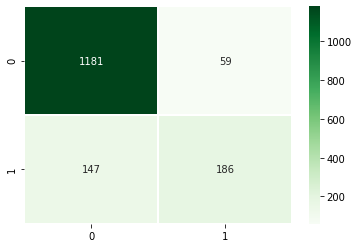

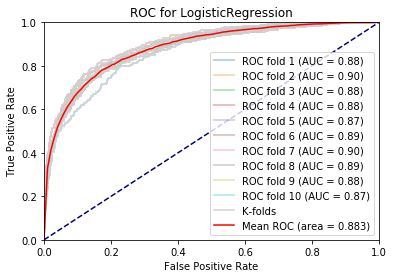

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


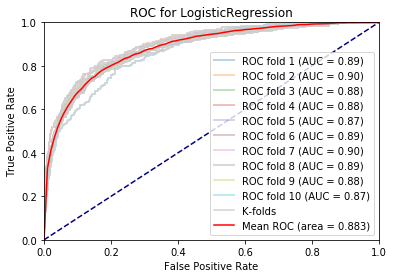

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


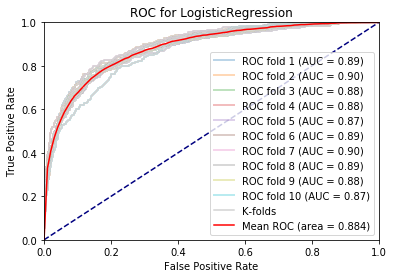

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


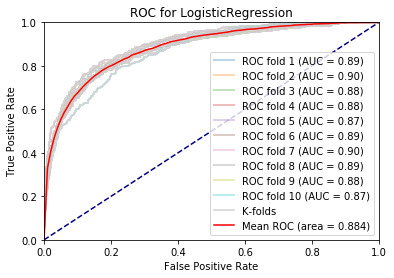

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


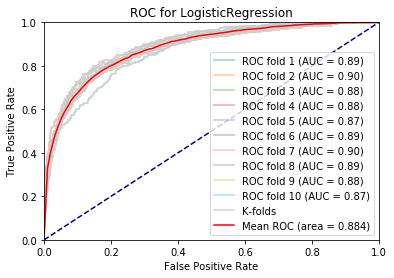

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


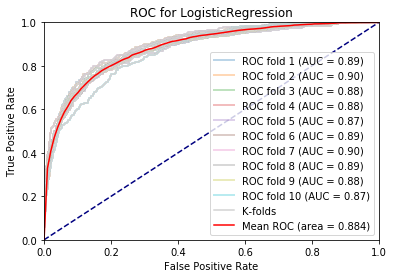

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


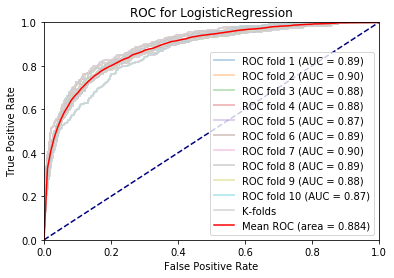

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


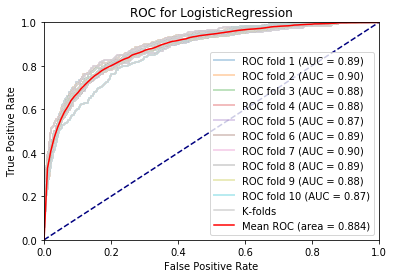

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


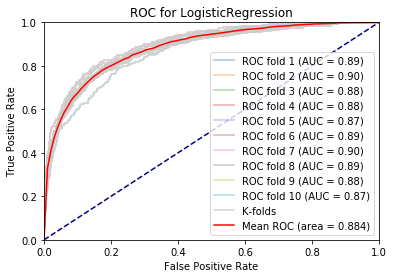

without_new_feature minMaxScalar SelectKBest LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


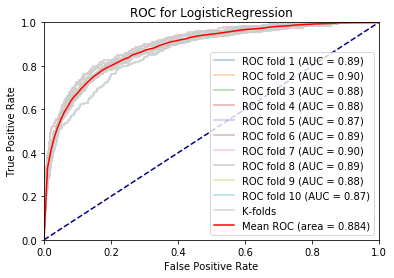

without_new_feature minMaxScalar SelectKBest GaussianNB(priors=None, var_smoothing=1e-09)


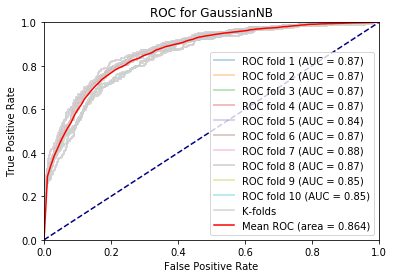

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


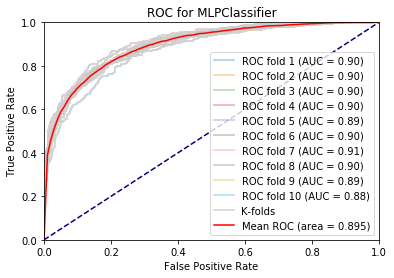

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


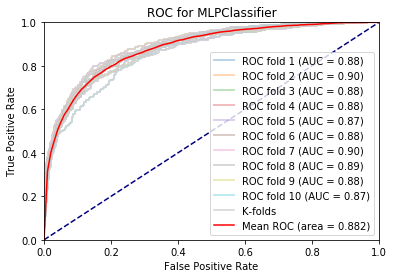

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


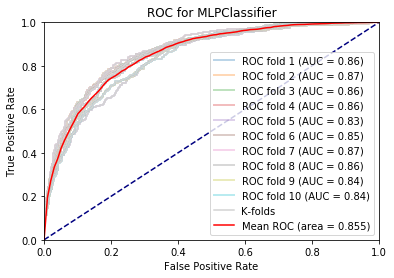

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


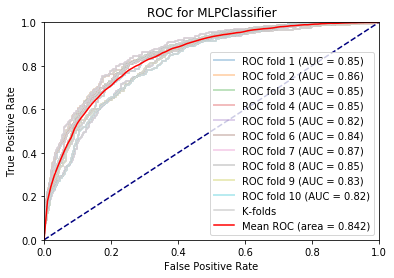

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


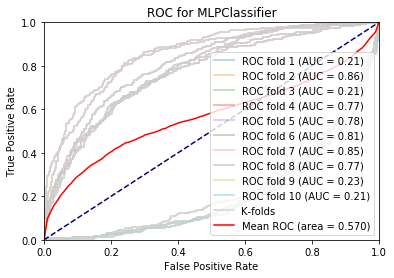

without_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


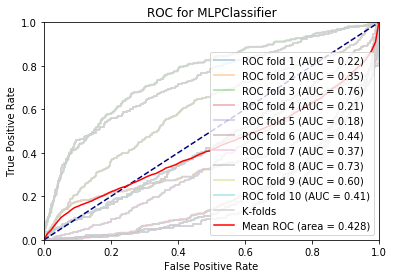

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


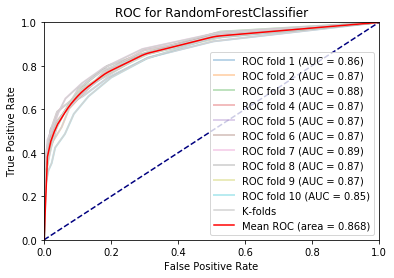

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


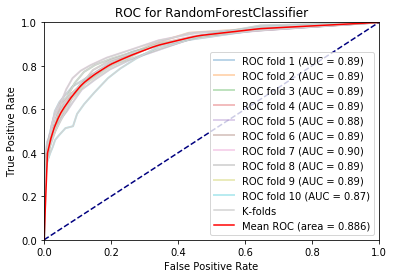

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


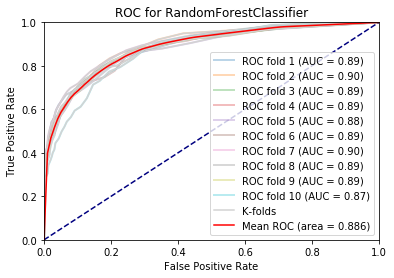

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


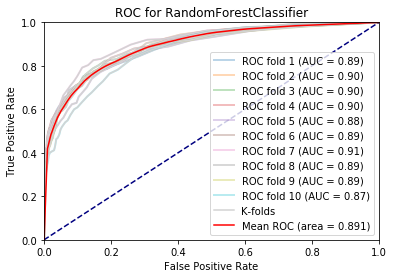

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


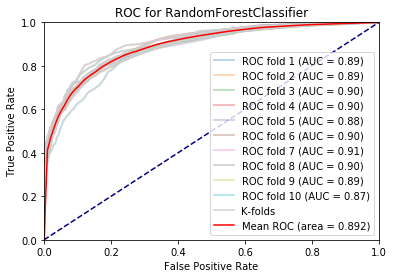

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


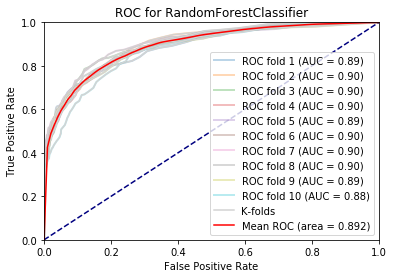

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


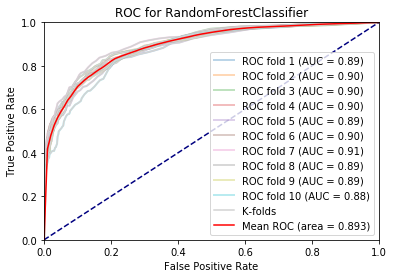

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


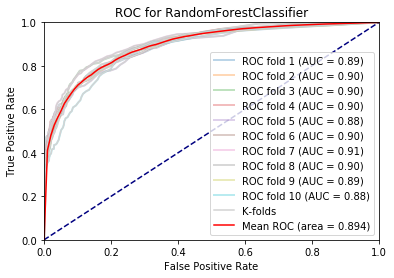

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


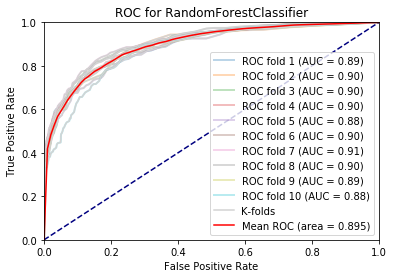

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


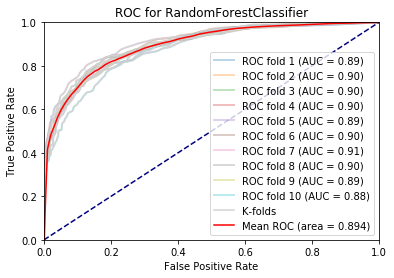

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


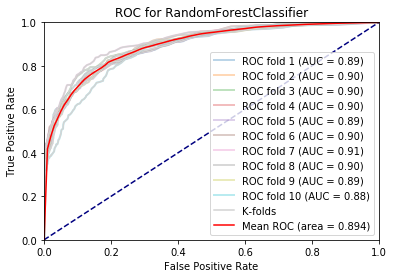

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


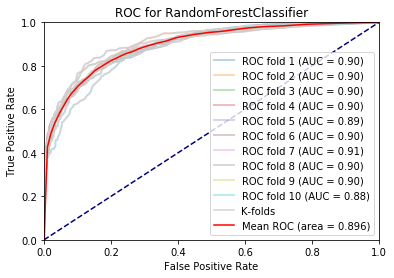

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


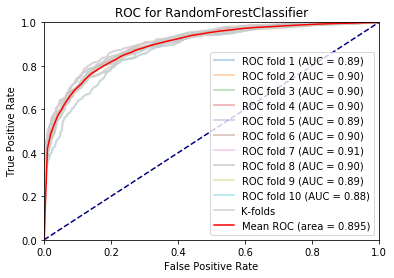

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


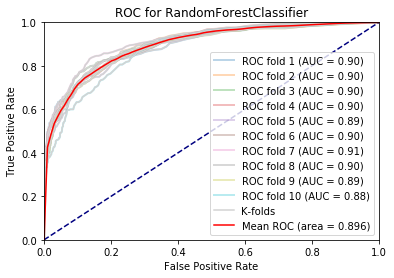

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


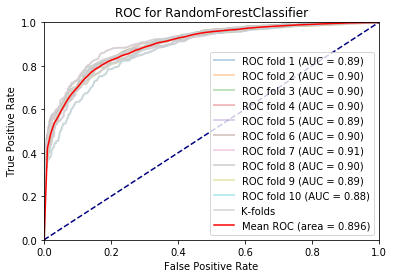

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


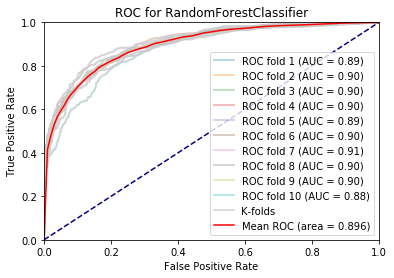

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


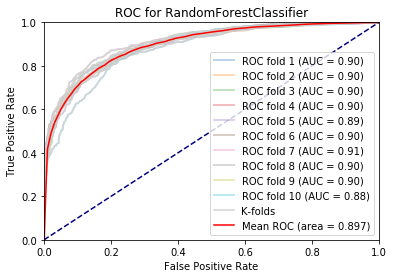

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


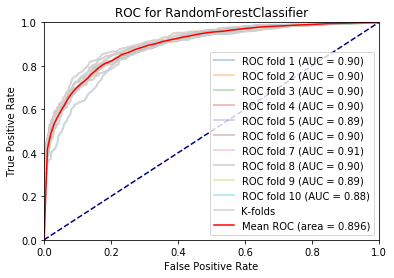

without_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


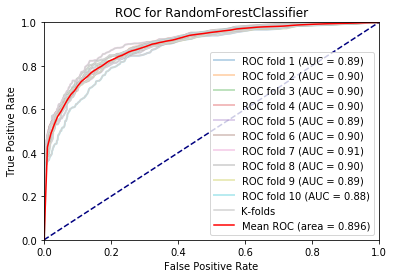

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


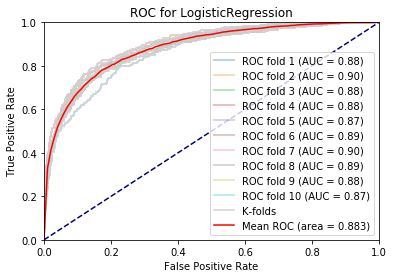

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


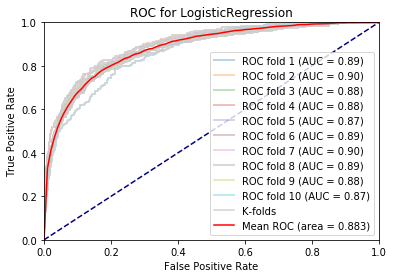

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


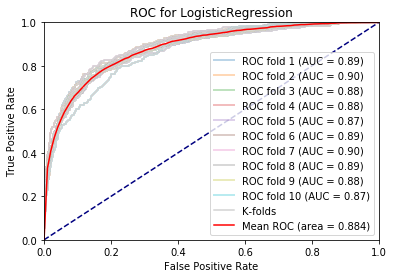

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


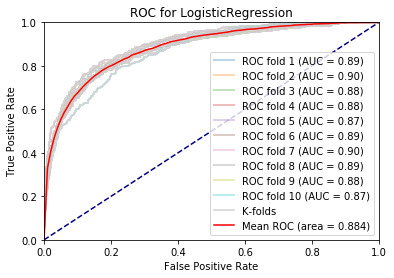

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


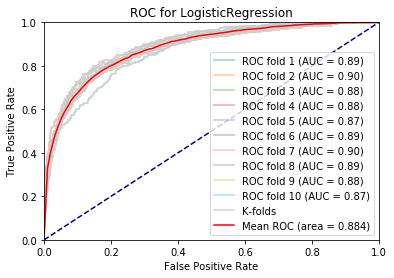

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


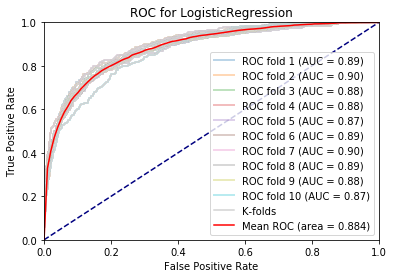

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


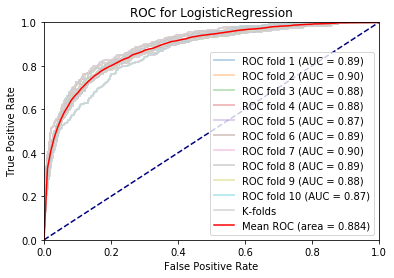

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


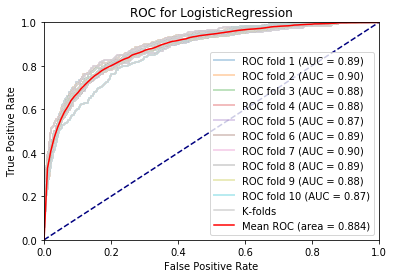

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


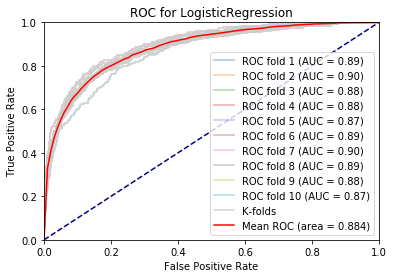

with_new_feature minMaxScalar SelectKBest LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


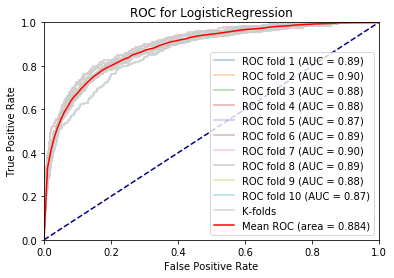

with_new_feature minMaxScalar SelectKBest GaussianNB(priors=None, var_smoothing=1e-09)


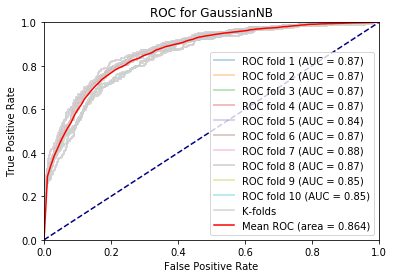

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


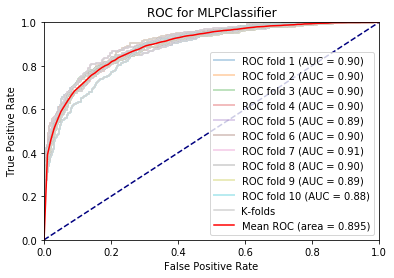

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


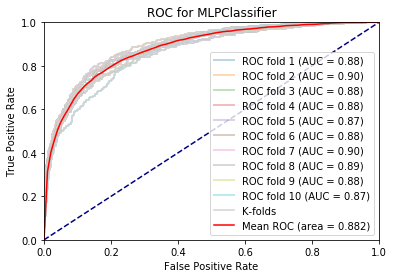

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


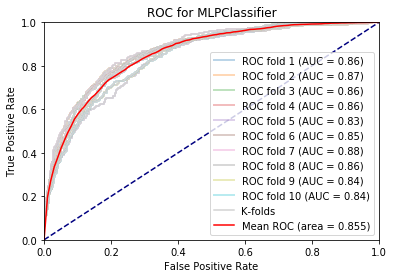

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


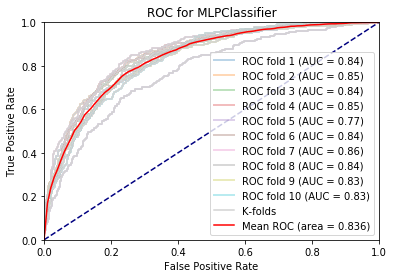

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


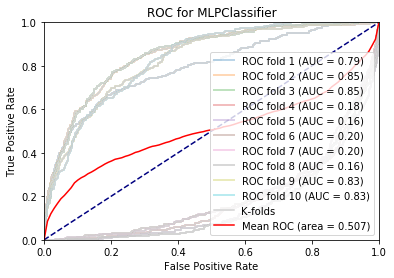

with_new_feature minMaxScalar SelectKBest MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


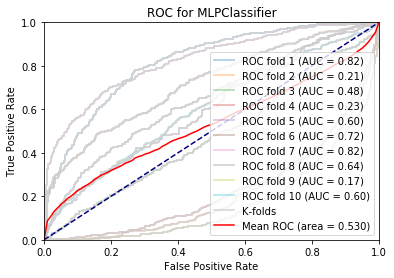

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


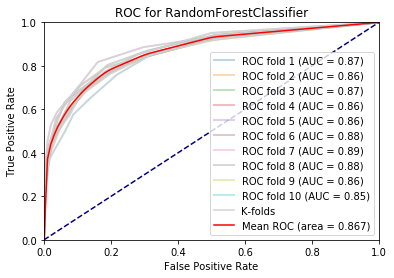

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


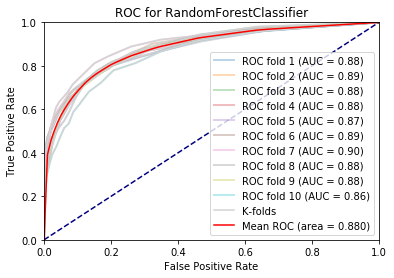

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


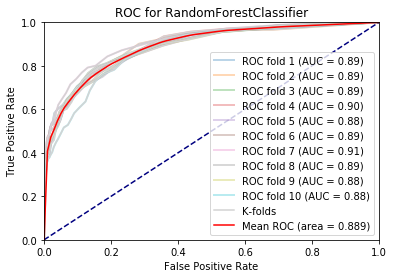

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


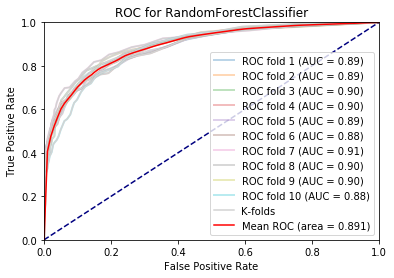

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


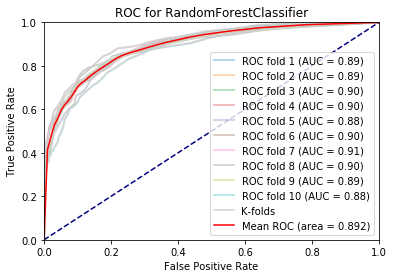

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


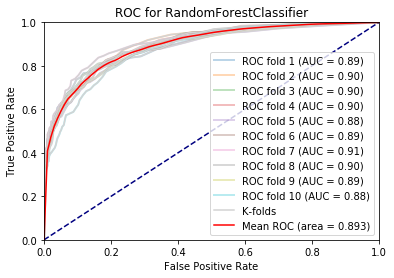

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


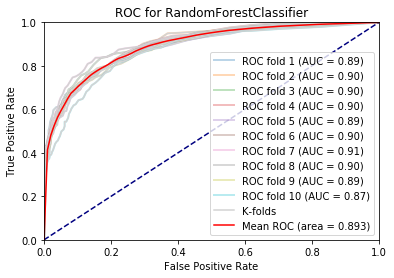

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


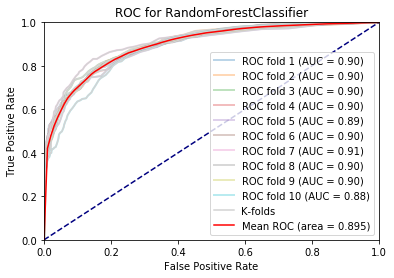

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


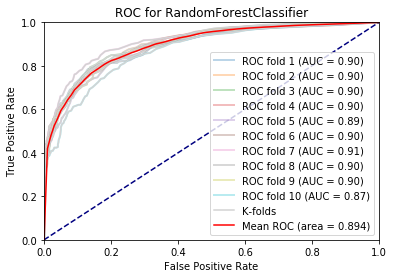

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


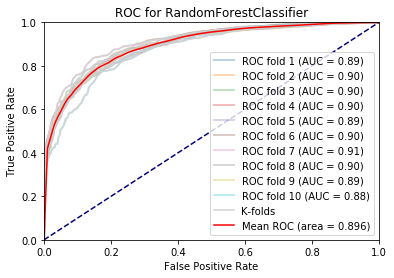

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


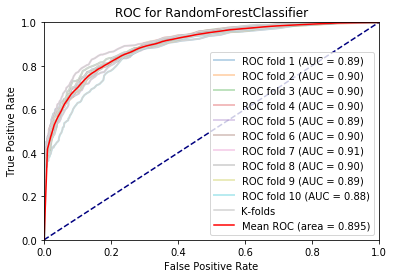

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


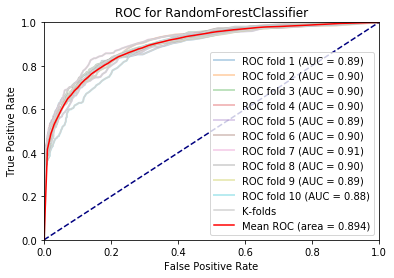

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


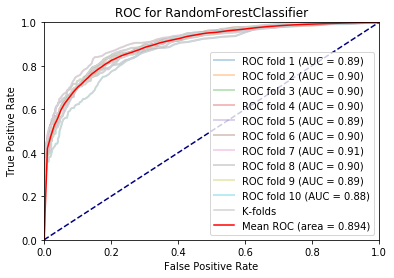

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


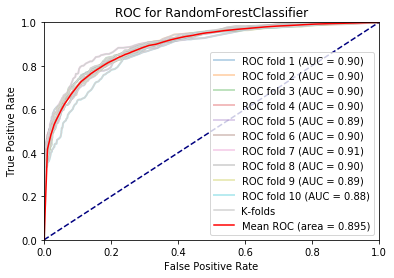

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


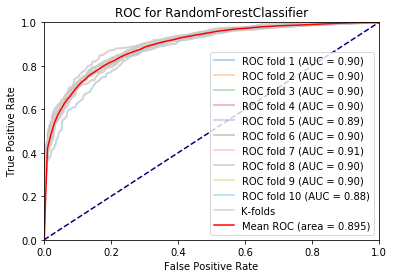

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


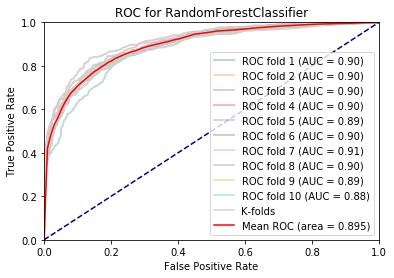

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


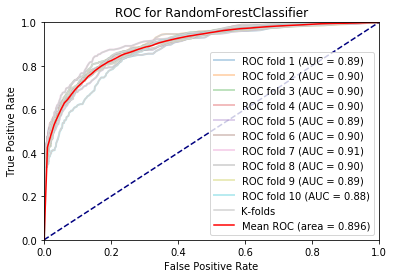

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


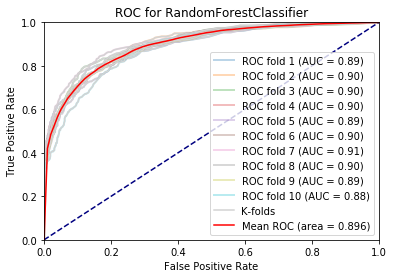

with_new_feature minMaxScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


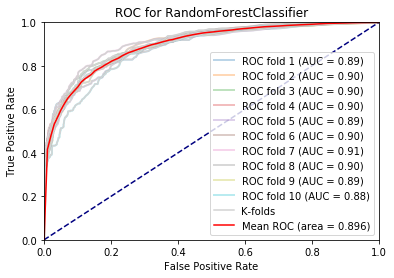

without_new_feature standardScalar SelectKBest LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


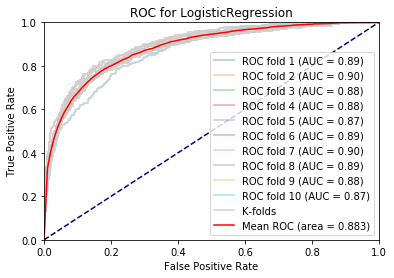

without_new_feature standardScalar SelectKBest LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


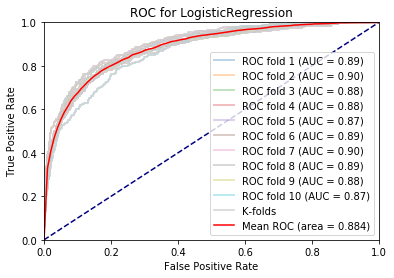

without_new_feature standardScalar SelectKBest LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


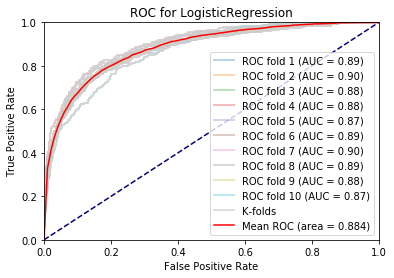

without_new_feature standardScalar SelectKBest LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


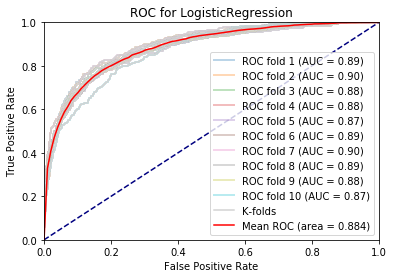

without_new_feature standardScalar SelectKBest LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


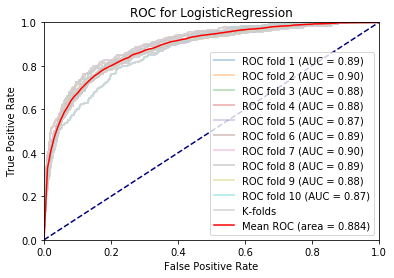

without_new_feature standardScalar SelectKBest LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


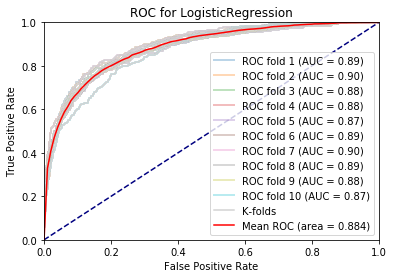

without_new_feature standardScalar SelectKBest LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


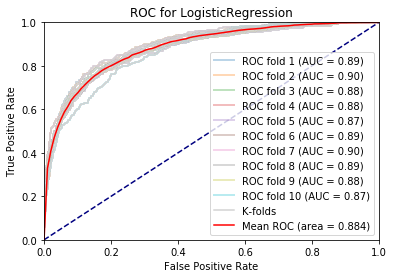

without_new_feature standardScalar SelectKBest LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


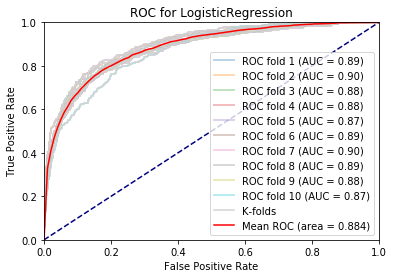

without_new_feature standardScalar SelectKBest LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


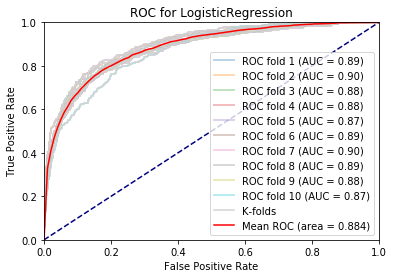

without_new_feature standardScalar SelectKBest LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


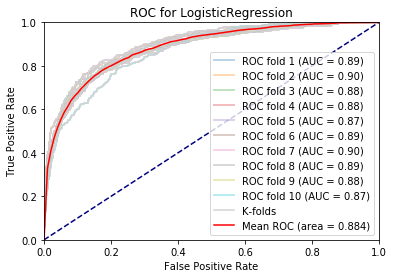

without_new_feature standardScalar SelectKBest GaussianNB(priors=None, var_smoothing=1e-09)


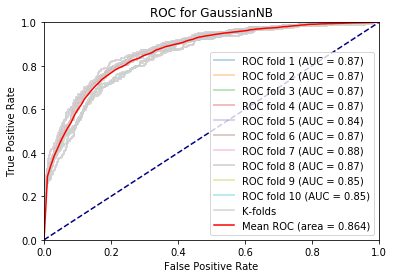

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


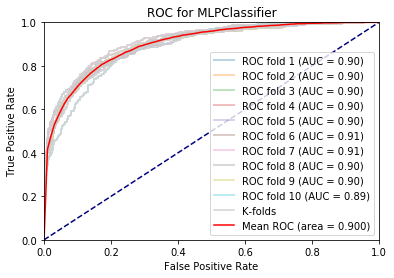

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


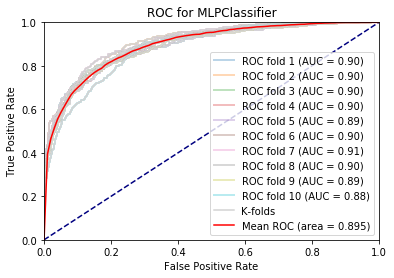

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


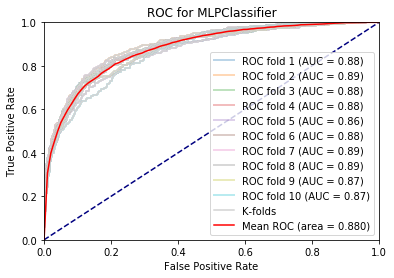

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


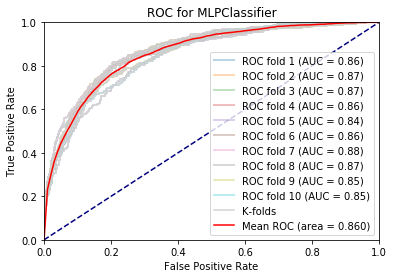

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


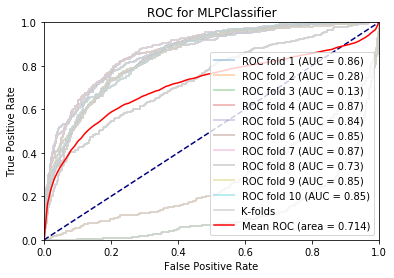

without_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


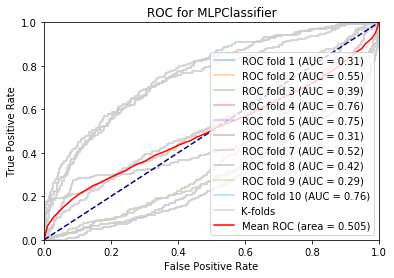

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


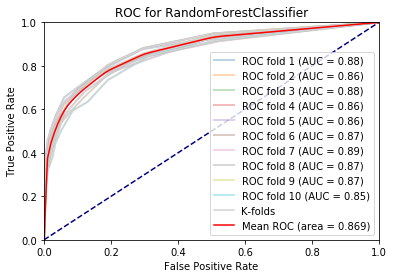

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


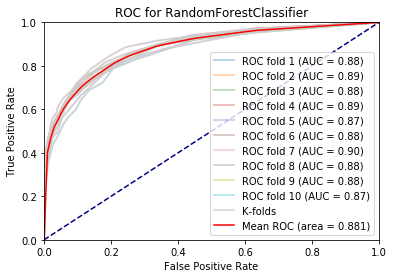

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


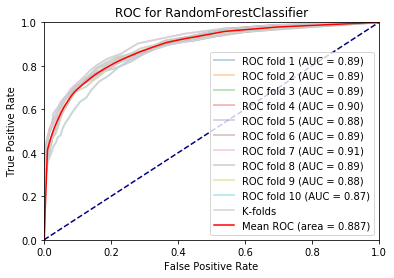

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


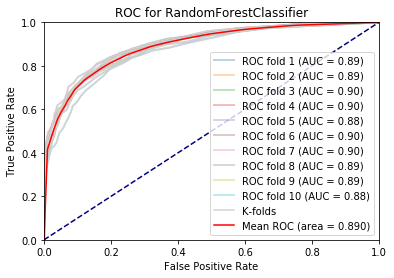

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


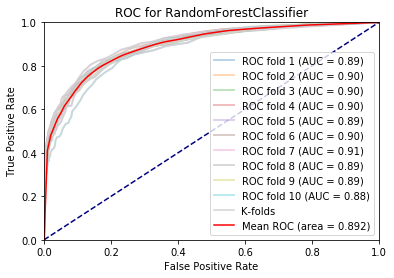

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


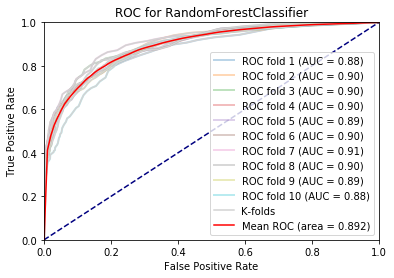

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


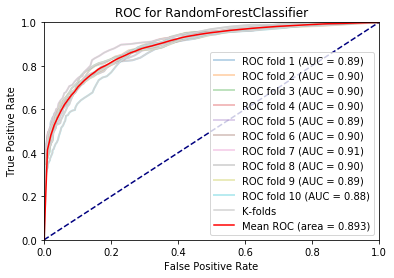

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


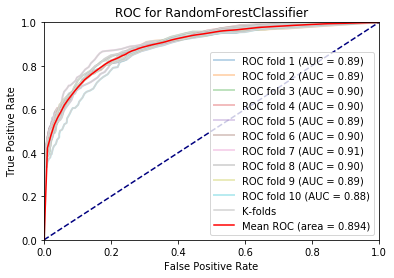

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


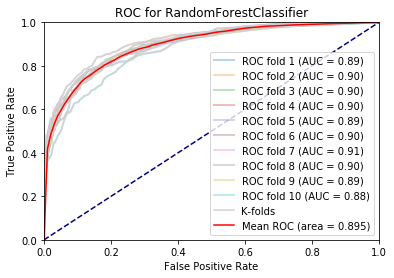

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


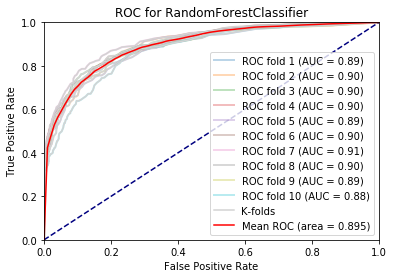

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


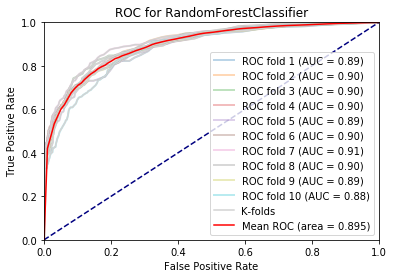

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


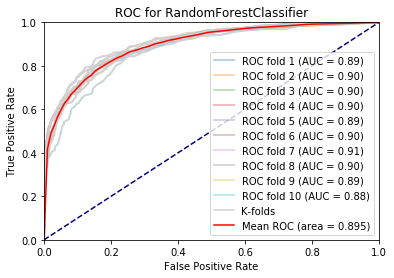

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


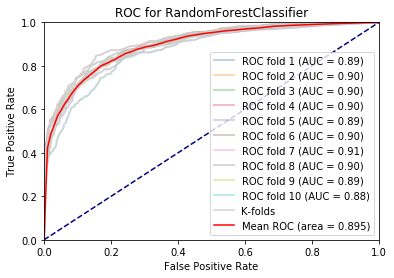

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


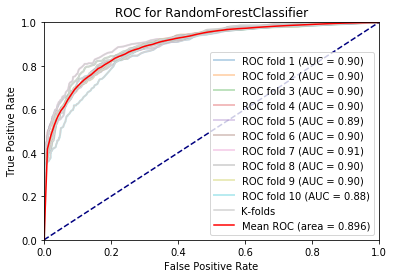

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


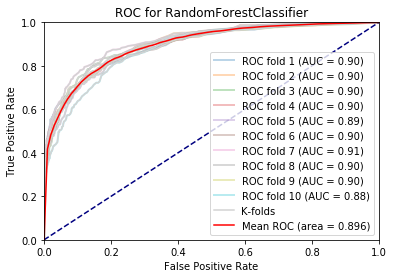

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


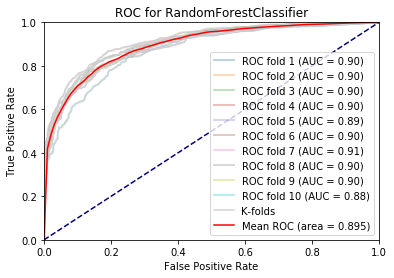

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


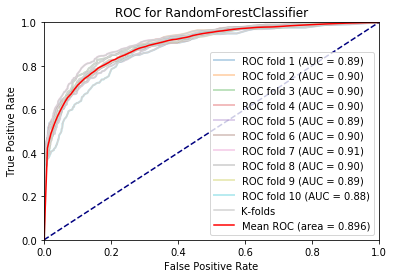

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


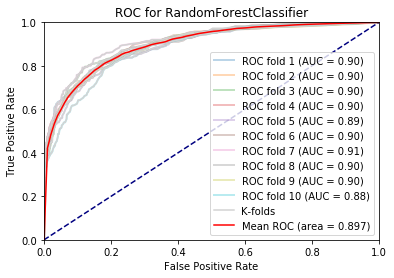

without_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


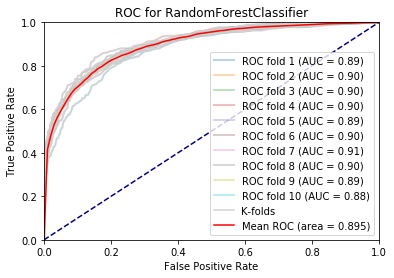

with_new_feature standardScalar SelectKBest LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


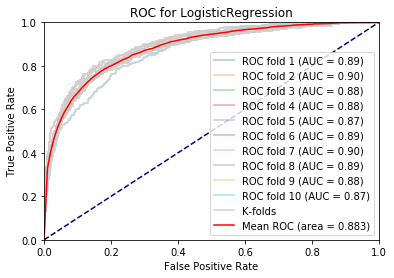

with_new_feature standardScalar SelectKBest LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


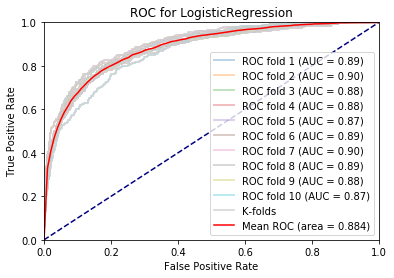

with_new_feature standardScalar SelectKBest LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


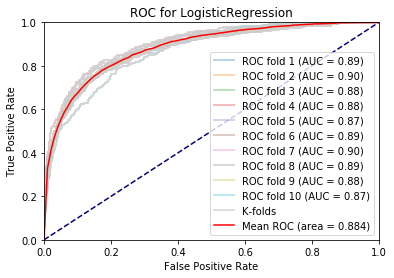

with_new_feature standardScalar SelectKBest LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


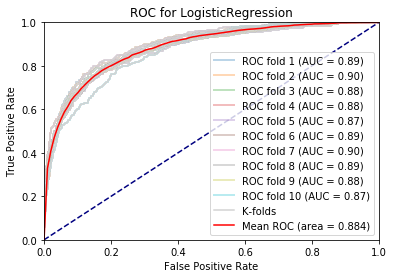

with_new_feature standardScalar SelectKBest LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


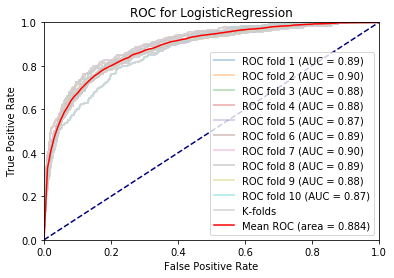

with_new_feature standardScalar SelectKBest LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


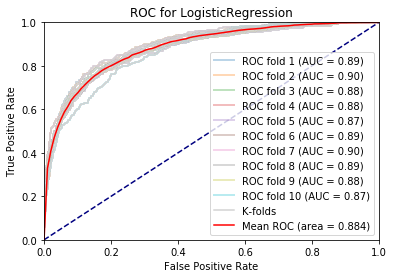

with_new_feature standardScalar SelectKBest LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


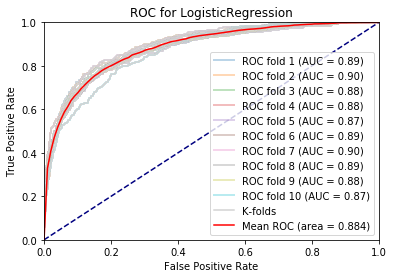

with_new_feature standardScalar SelectKBest LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


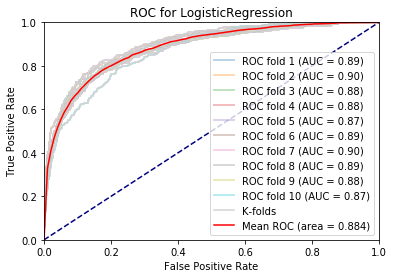

with_new_feature standardScalar SelectKBest LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


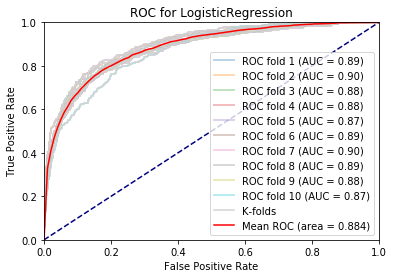

with_new_feature standardScalar SelectKBest LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


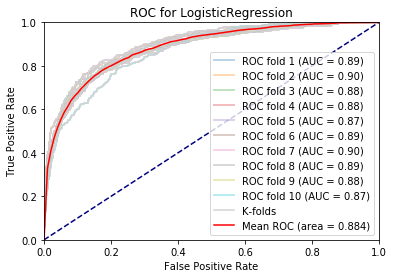

with_new_feature standardScalar SelectKBest GaussianNB(priors=None, var_smoothing=1e-09)


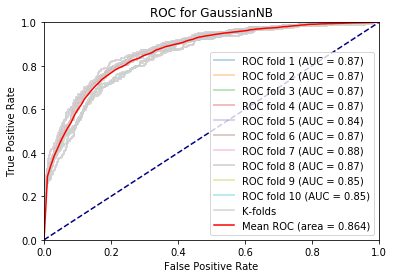

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


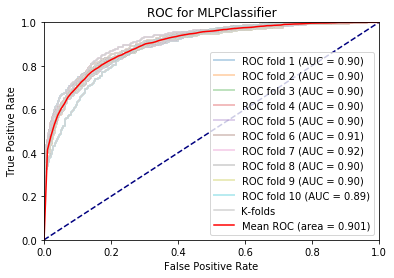

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


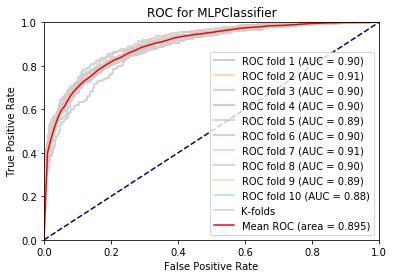

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


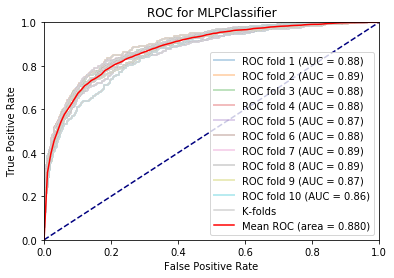

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


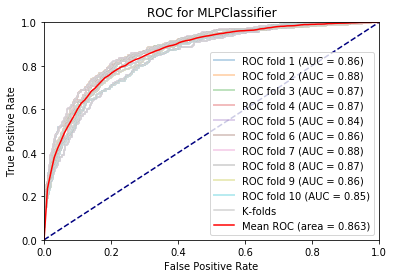

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


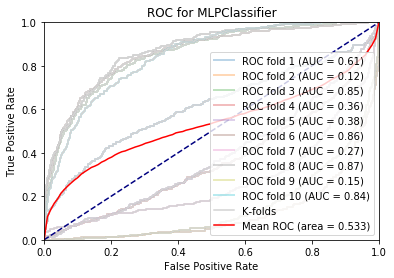

with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


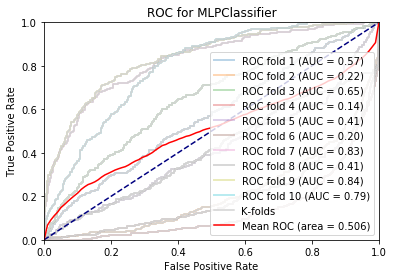

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


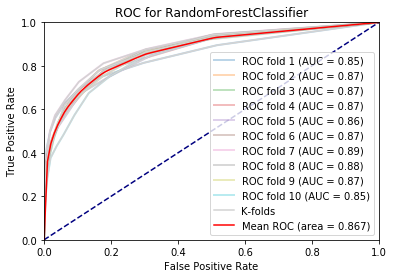

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


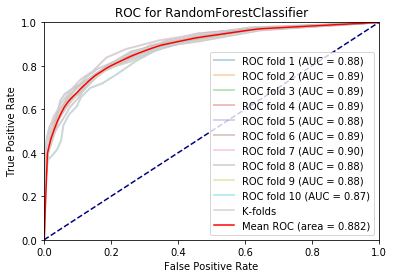

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


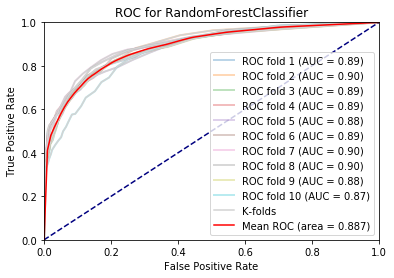

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


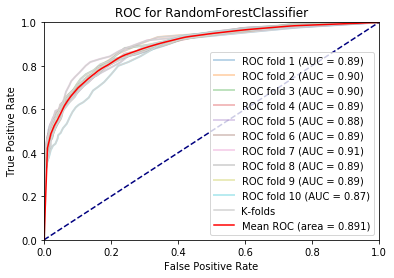

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


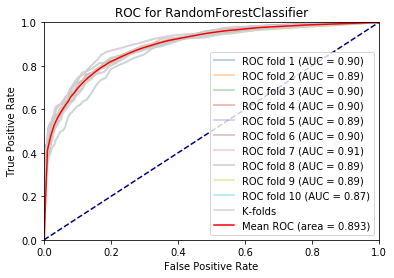

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


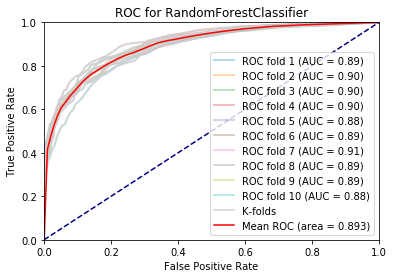

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


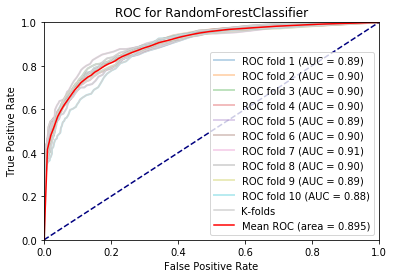

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


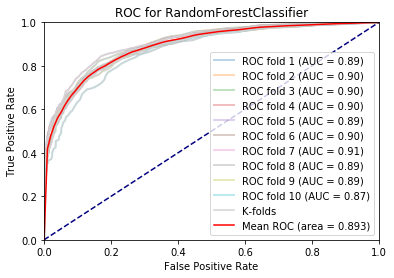

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


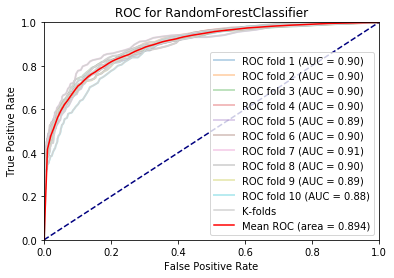

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


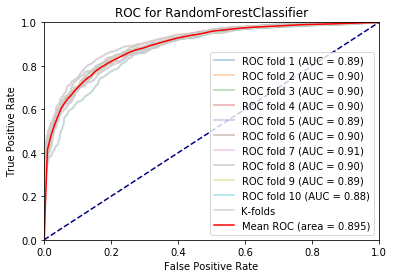

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


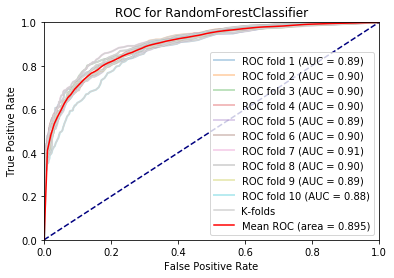

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


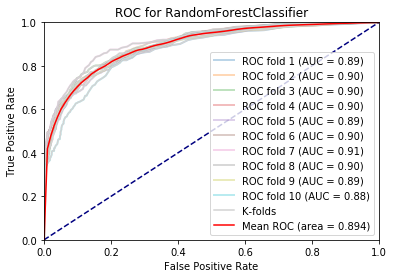

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


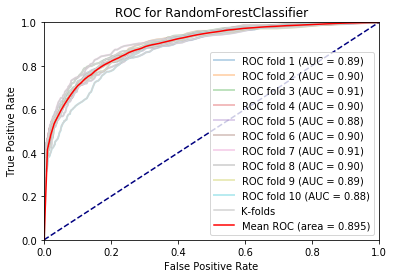

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


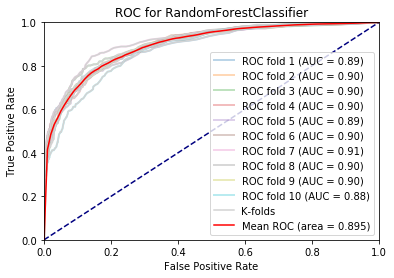

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


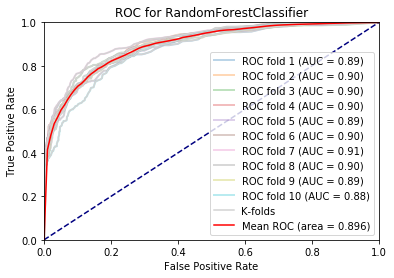

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


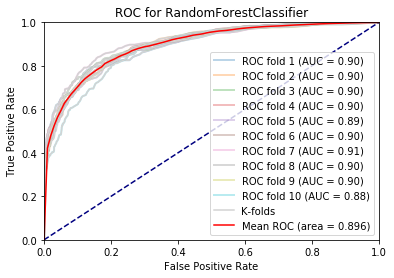

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


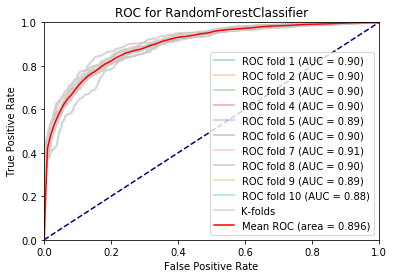

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


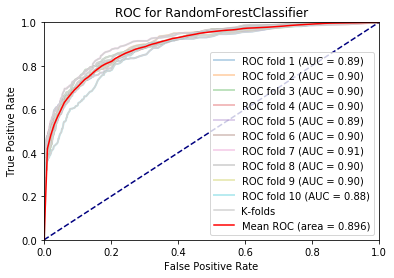

with_new_feature standardScalar SelectKBest RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


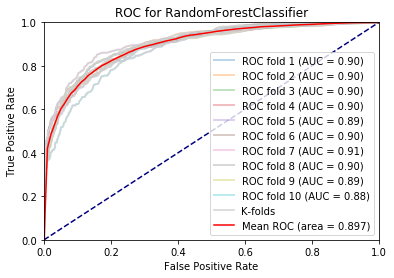

without_new_feature minMaxScalar pca LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


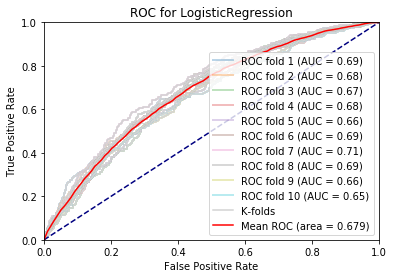

without_new_feature minMaxScalar pca LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


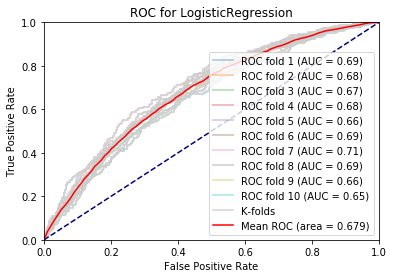

without_new_feature minMaxScalar pca LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


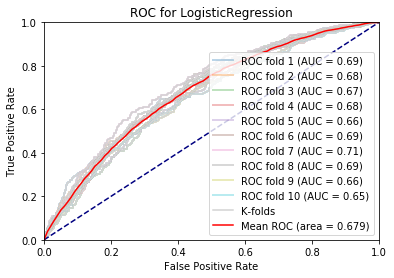

without_new_feature minMaxScalar pca LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


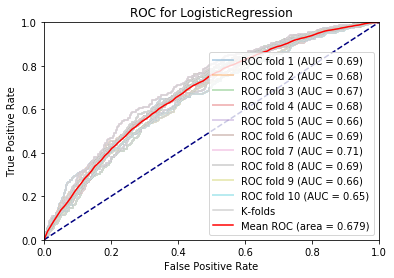

without_new_feature minMaxScalar pca LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


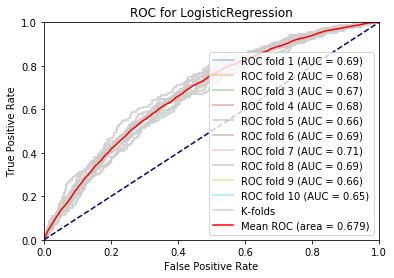

without_new_feature minMaxScalar pca LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


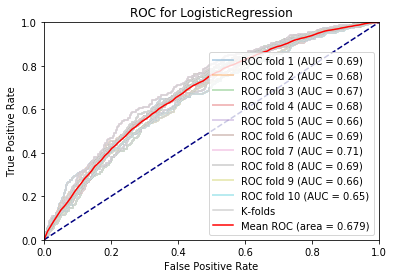

without_new_feature minMaxScalar pca LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


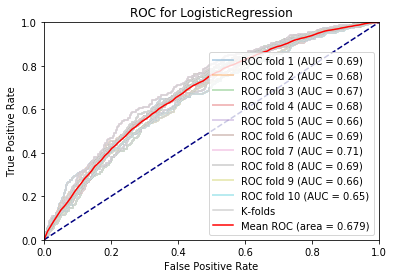

without_new_feature minMaxScalar pca LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


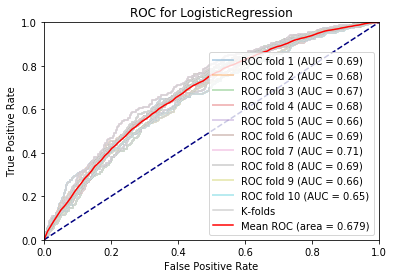

without_new_feature minMaxScalar pca LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


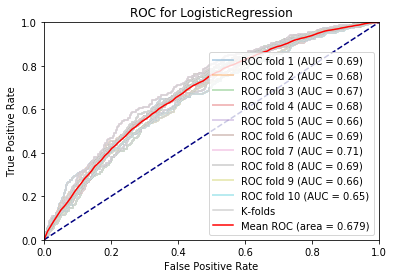

without_new_feature minMaxScalar pca LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


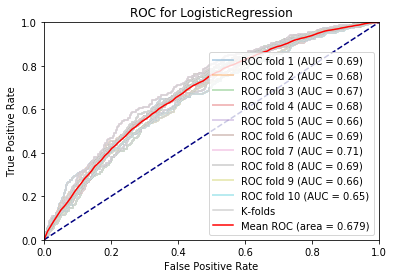

without_new_feature minMaxScalar pca GaussianNB(priors=None, var_smoothing=1e-09)


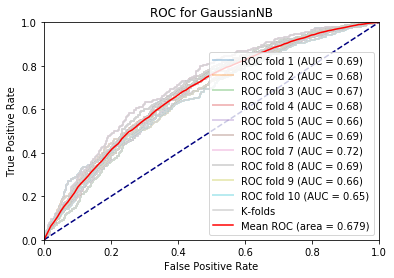

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


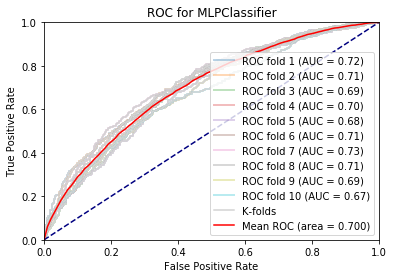

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


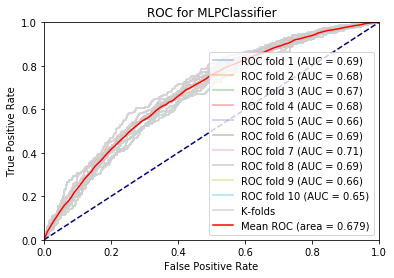

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


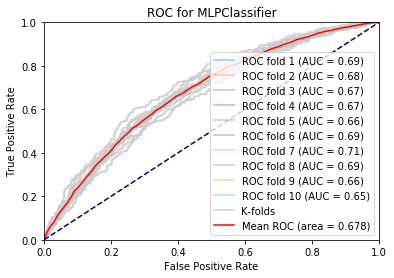

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


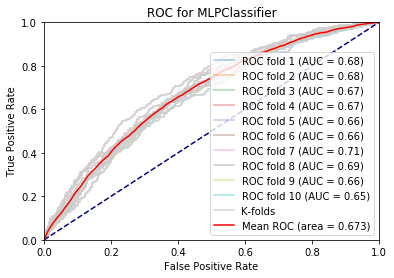

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


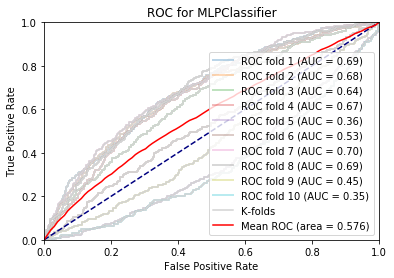

without_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


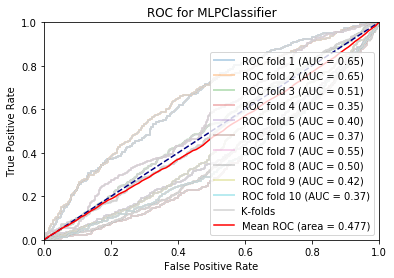

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


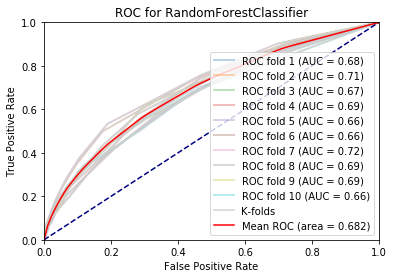

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


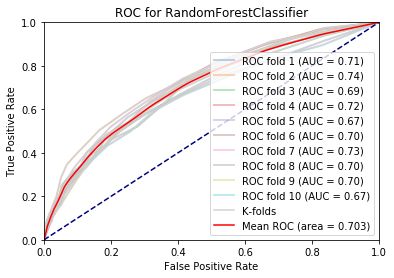

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


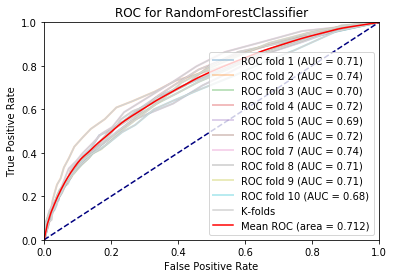

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


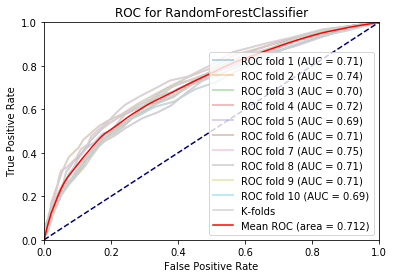

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


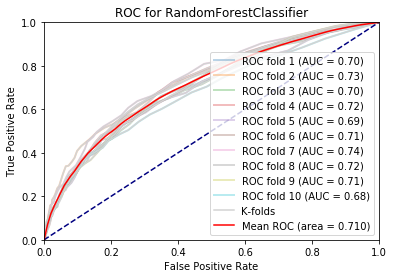

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


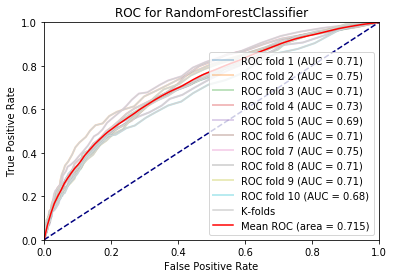

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


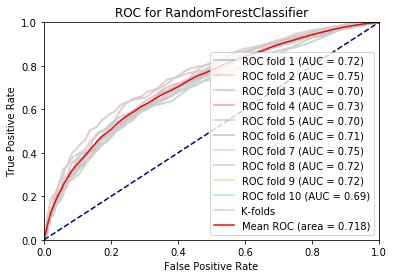

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


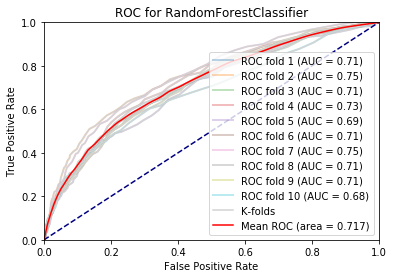

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


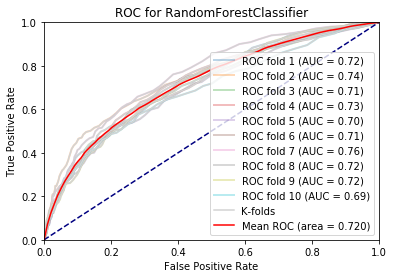

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


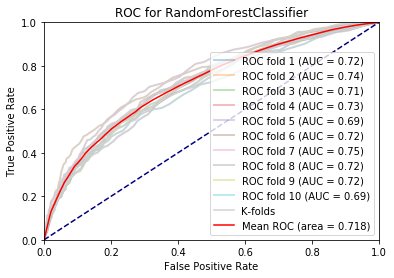

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


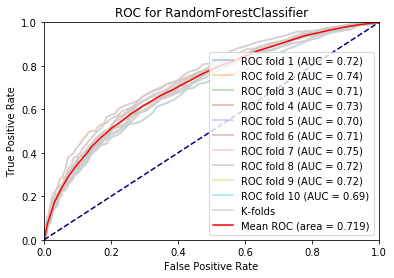

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


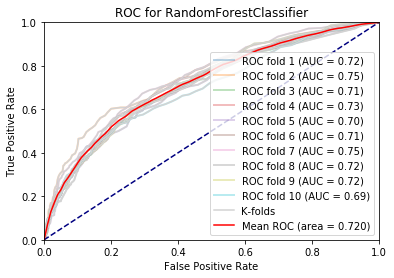

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


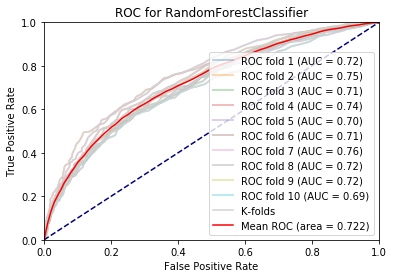

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


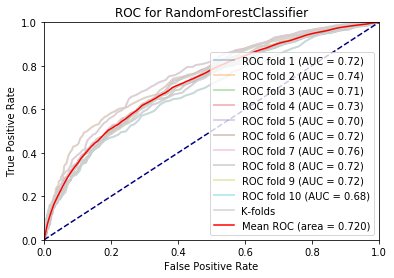

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


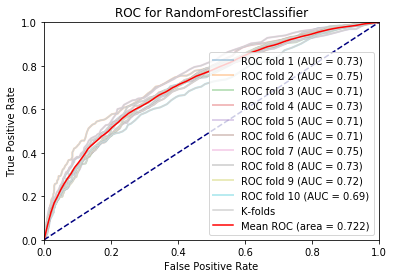

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


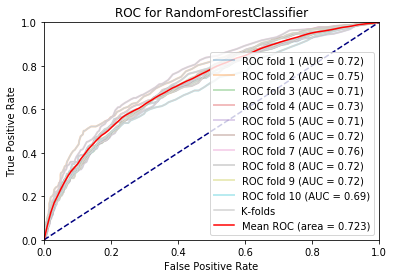

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


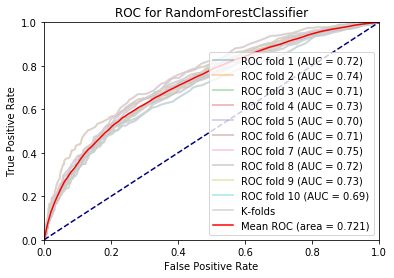

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


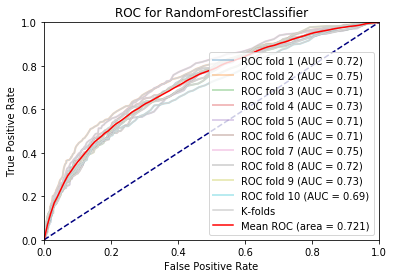

without_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


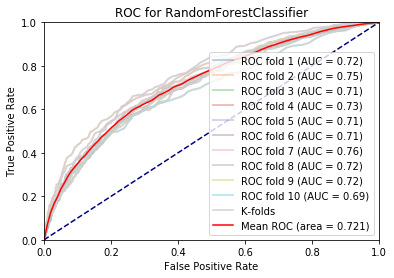

with_new_feature minMaxScalar pca LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


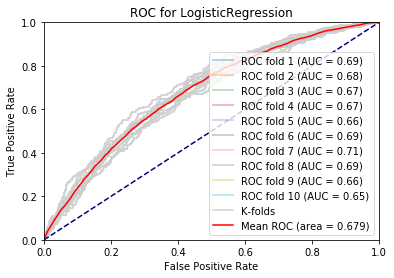

with_new_feature minMaxScalar pca LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


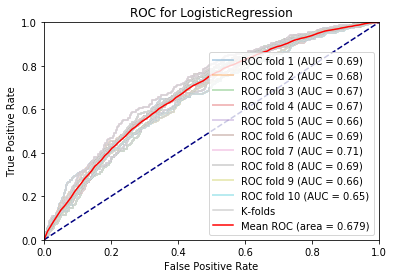

with_new_feature minMaxScalar pca LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


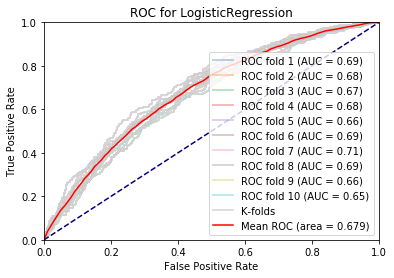

with_new_feature minMaxScalar pca LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


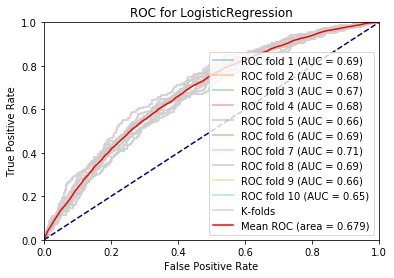

with_new_feature minMaxScalar pca LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


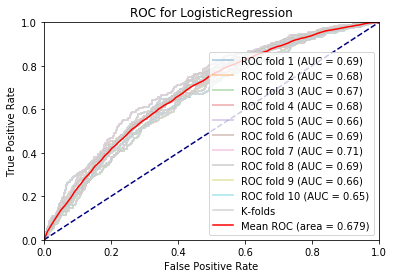

with_new_feature minMaxScalar pca LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


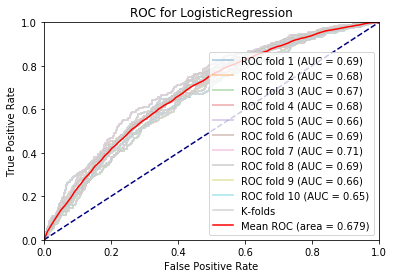

with_new_feature minMaxScalar pca LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


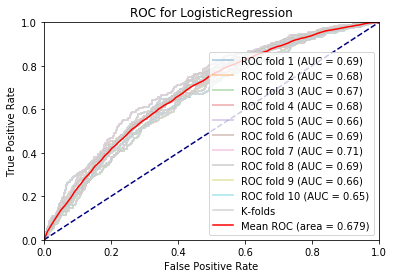

with_new_feature minMaxScalar pca LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


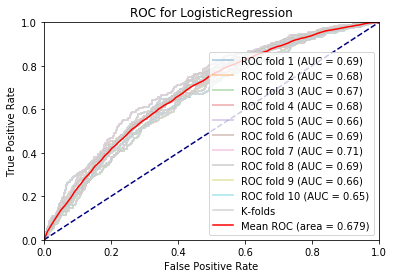

with_new_feature minMaxScalar pca LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


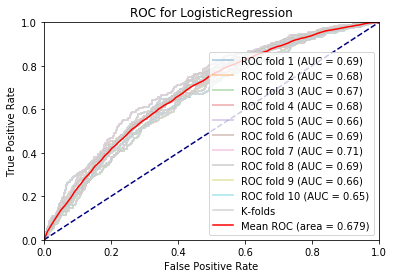

with_new_feature minMaxScalar pca LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


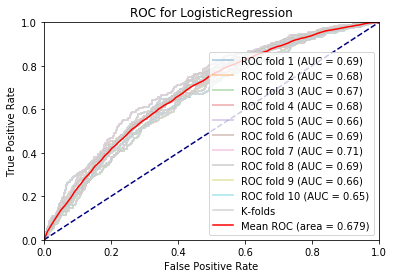

with_new_feature minMaxScalar pca GaussianNB(priors=None, var_smoothing=1e-09)


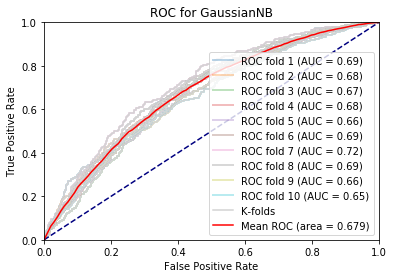

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


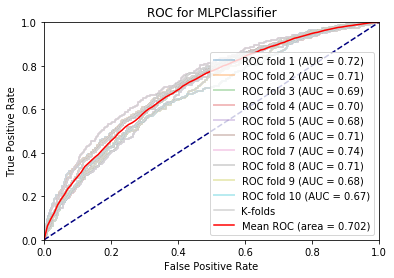

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


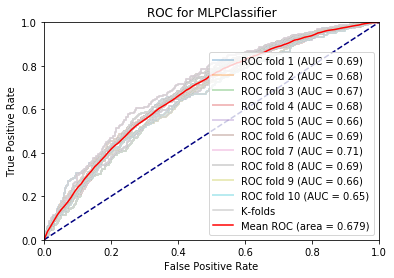

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


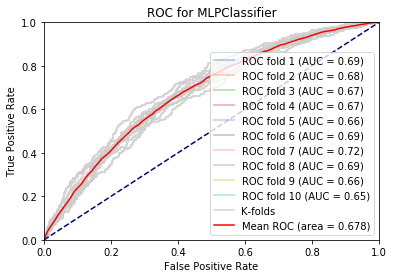

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


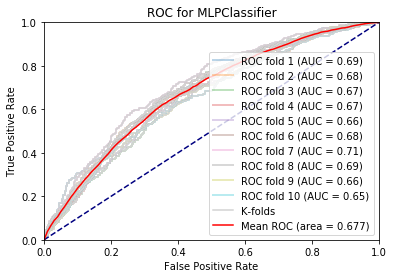

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


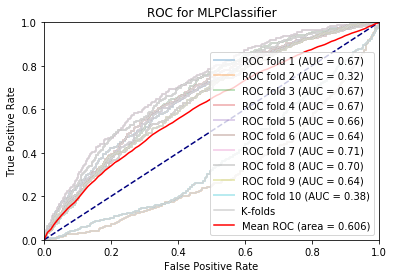

with_new_feature minMaxScalar pca MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


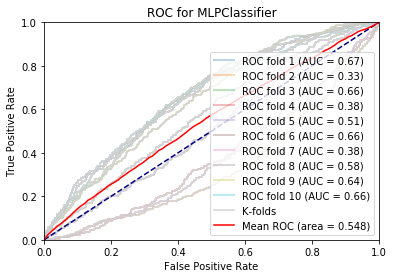

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


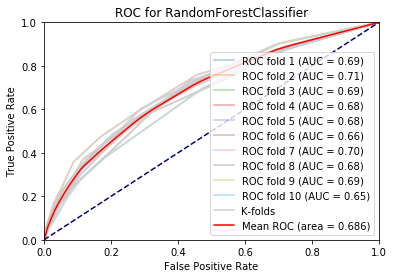

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


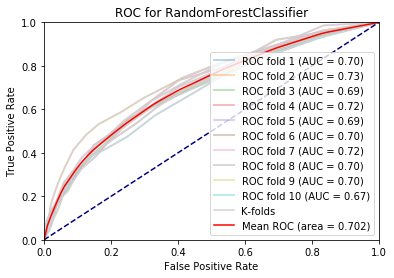

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


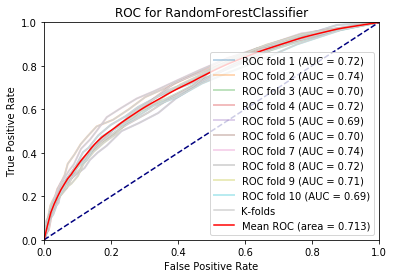

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


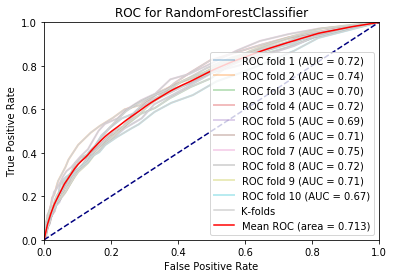

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


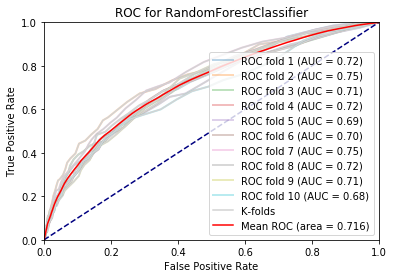

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


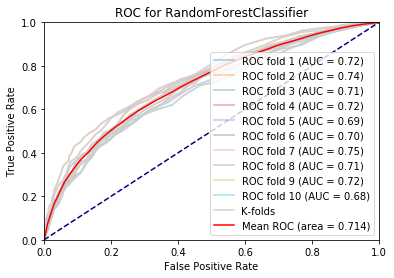

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


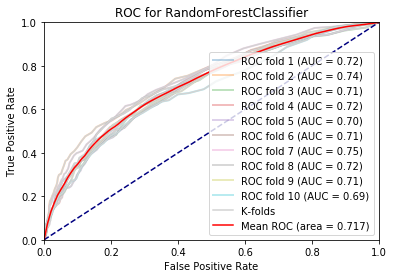

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


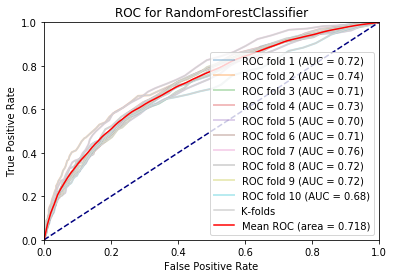

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


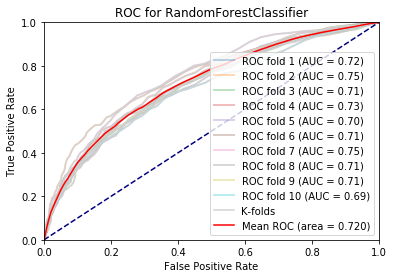

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


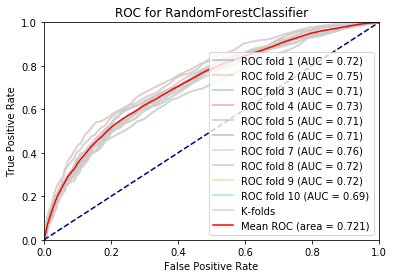

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


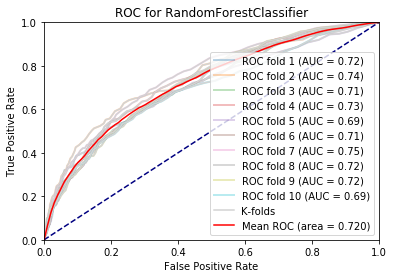

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


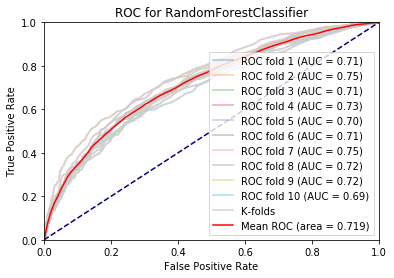

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


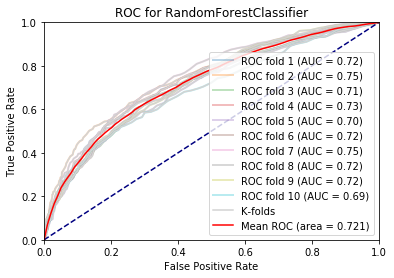

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


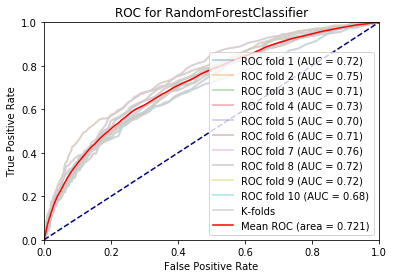

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


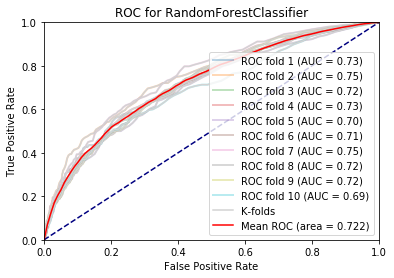

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


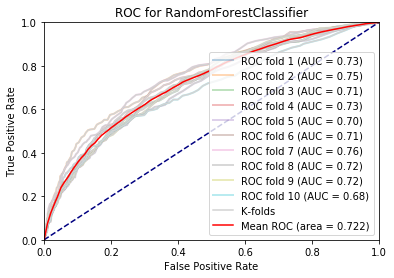

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


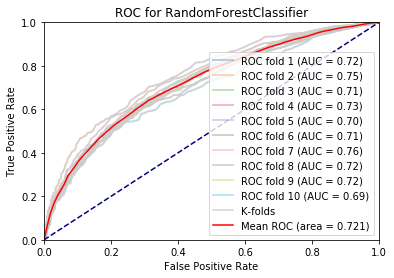

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


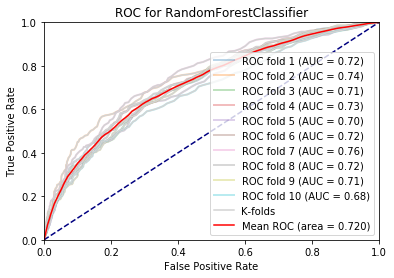

with_new_feature minMaxScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


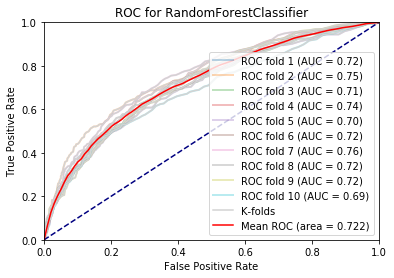

without_new_feature standardScalar pca LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


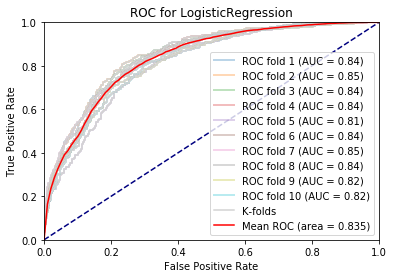

without_new_feature standardScalar pca LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


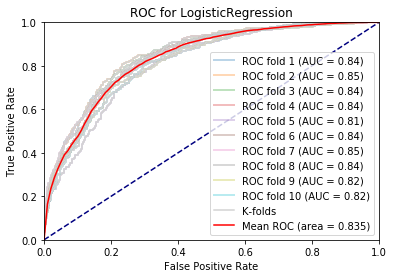

without_new_feature standardScalar pca LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


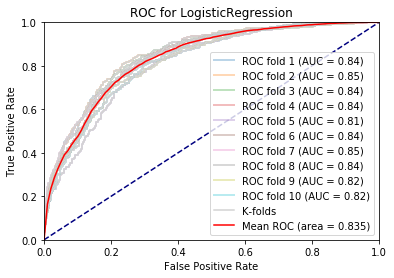

without_new_feature standardScalar pca LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


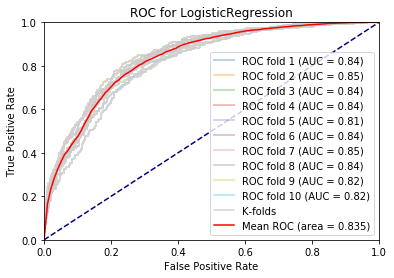

without_new_feature standardScalar pca LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


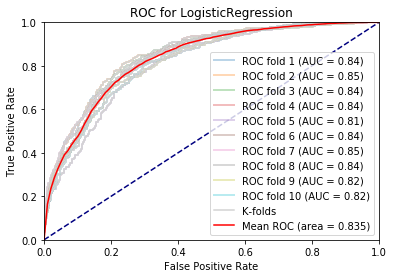

without_new_feature standardScalar pca LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


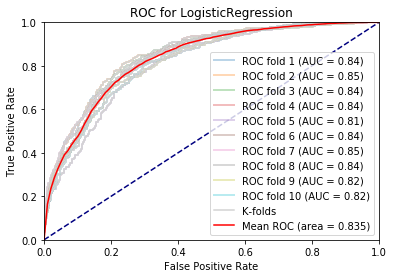

without_new_feature standardScalar pca LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


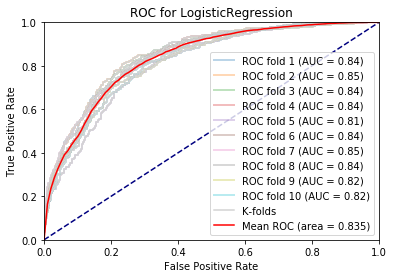

without_new_feature standardScalar pca LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


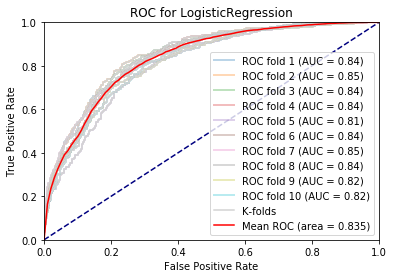

without_new_feature standardScalar pca LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


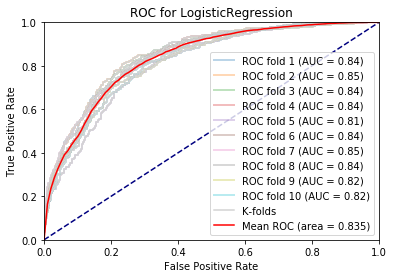

without_new_feature standardScalar pca LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


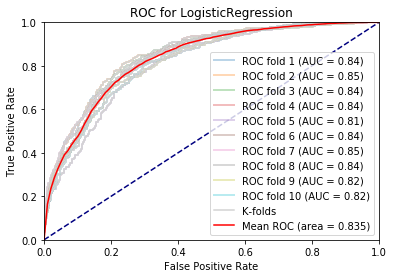

without_new_feature standardScalar pca GaussianNB(priors=None, var_smoothing=1e-09)


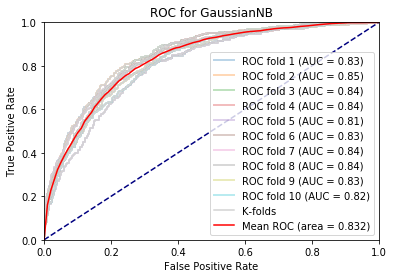

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


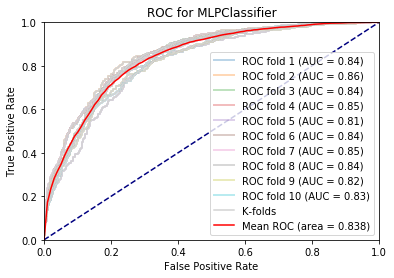

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


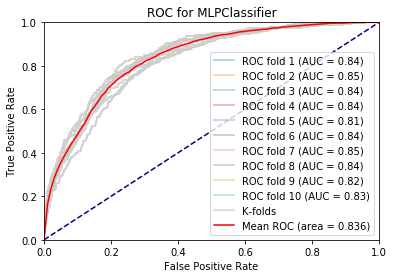

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


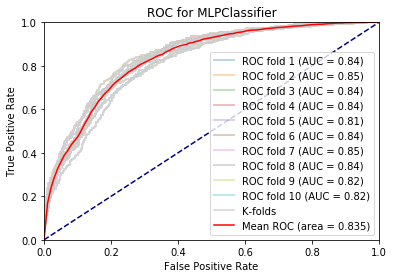

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


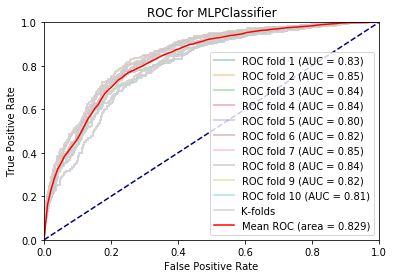

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


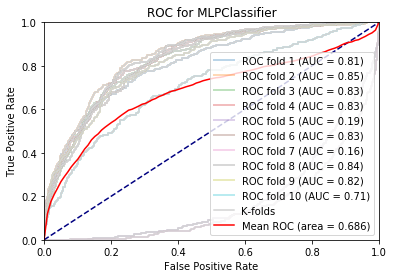

without_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


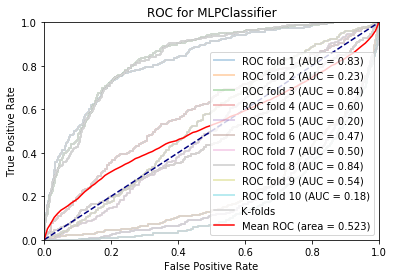

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


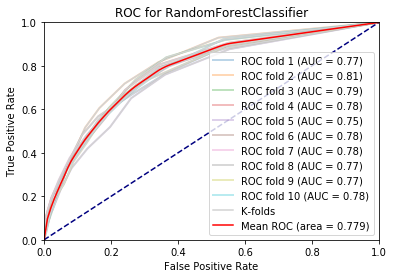

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


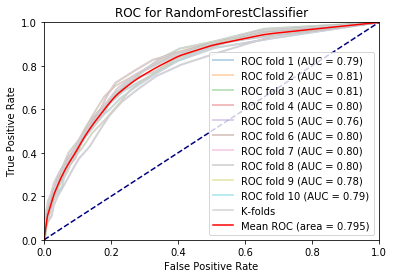

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


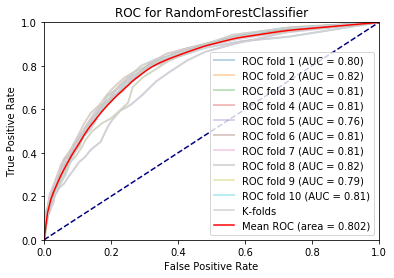

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


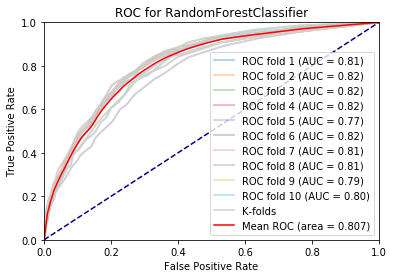

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


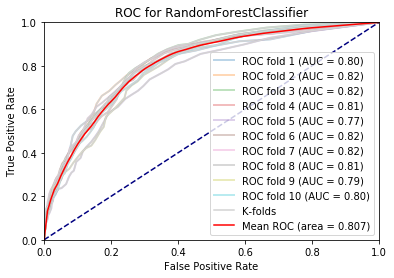

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


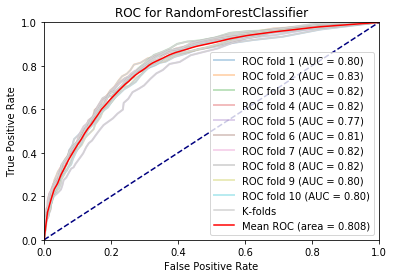

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


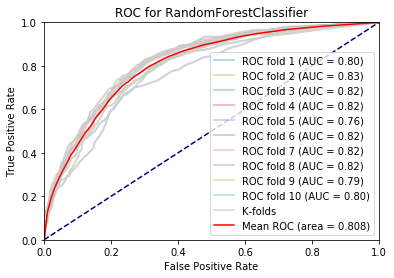

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


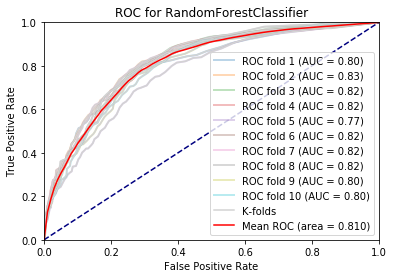

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


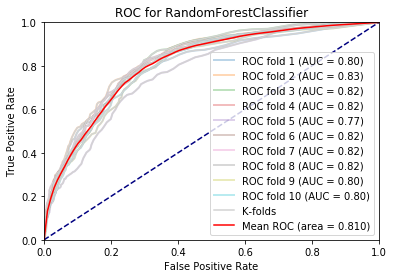

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


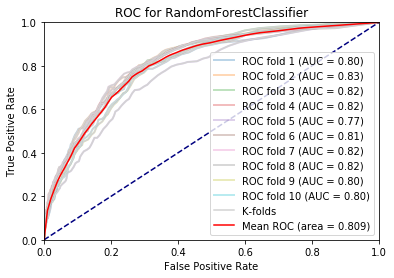

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


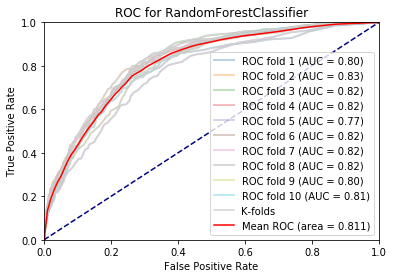

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


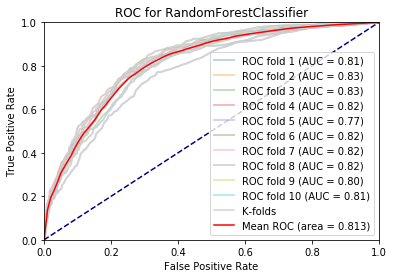

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


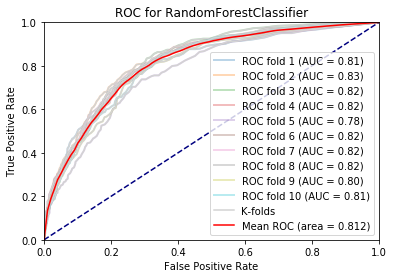

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


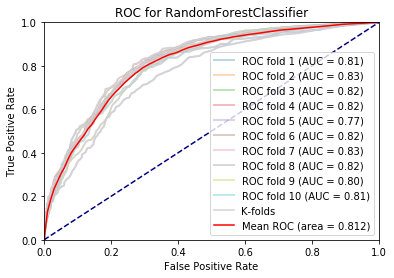

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


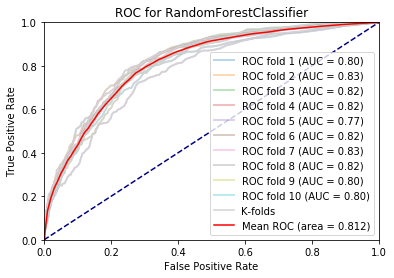

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


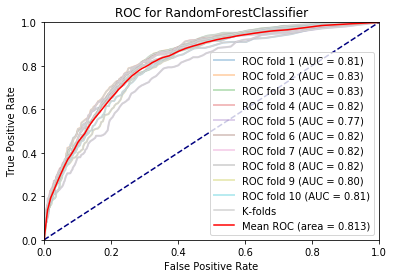

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


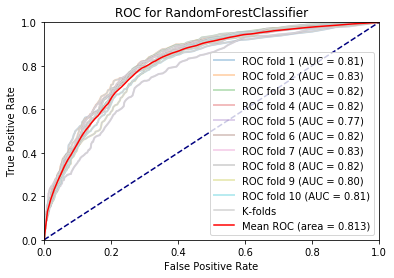

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


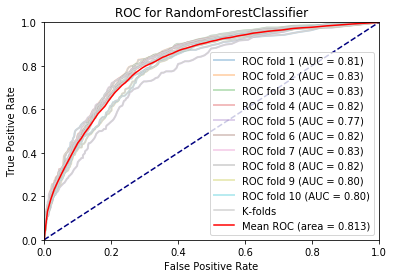

without_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


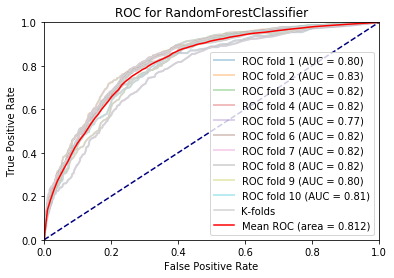

with_new_feature standardScalar pca LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


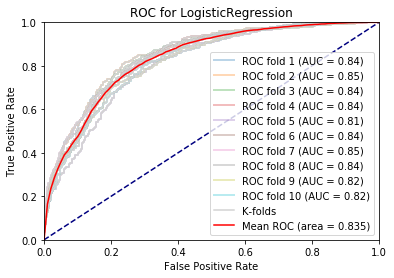

with_new_feature standardScalar pca LogisticRegression(C=2.7825594022071245, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


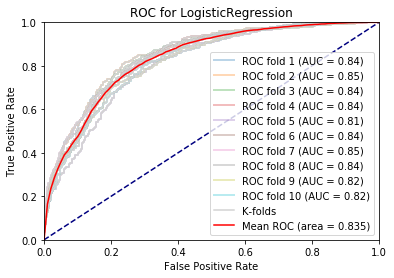

with_new_feature standardScalar pca LogisticRegression(C=7.742636826811269, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


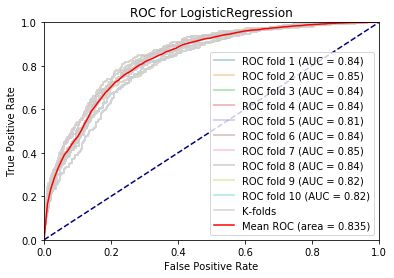

with_new_feature standardScalar pca LogisticRegression(C=21.544346900318832, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


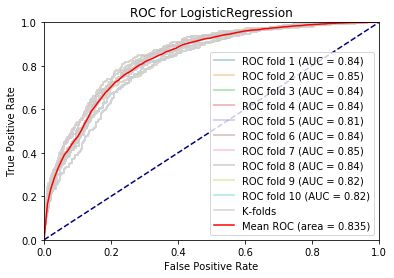

with_new_feature standardScalar pca LogisticRegression(C=59.94842503189409, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


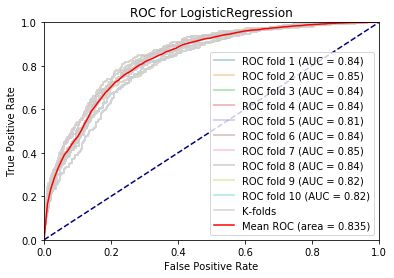

with_new_feature standardScalar pca LogisticRegression(C=166.81005372000593, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


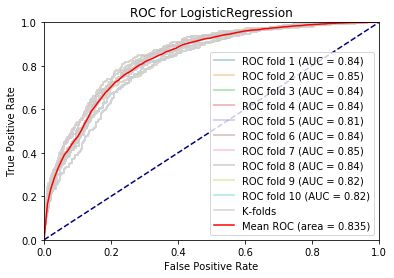

with_new_feature standardScalar pca LogisticRegression(C=464.15888336127773, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


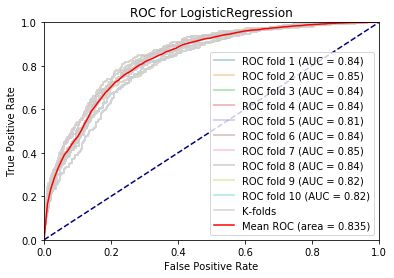

with_new_feature standardScalar pca LogisticRegression(C=1291.5496650148827, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


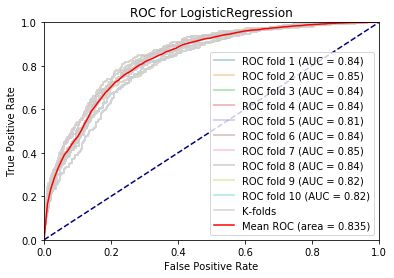

with_new_feature standardScalar pca LogisticRegression(C=3593.813663804626, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


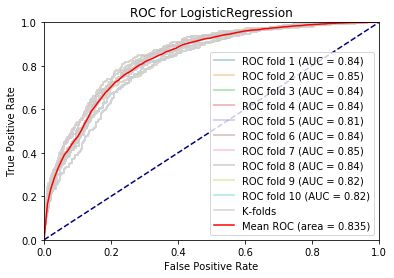

with_new_feature standardScalar pca LogisticRegression(C=10000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


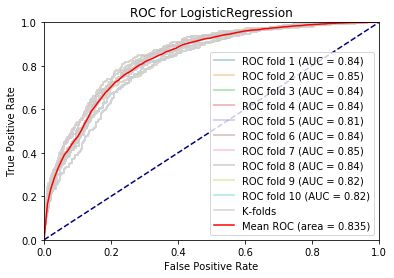

with_new_feature standardScalar pca GaussianNB(priors=None, var_smoothing=1e-09)


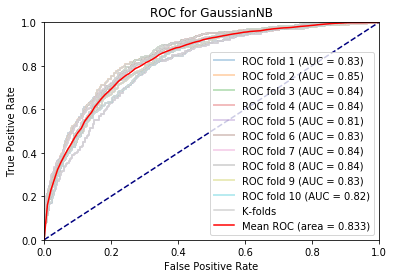

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


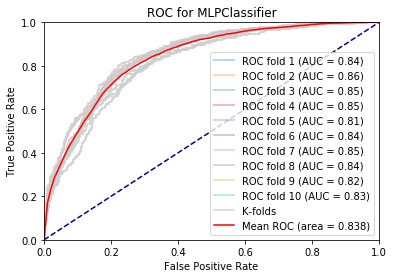

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


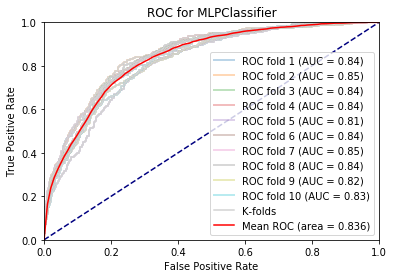

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


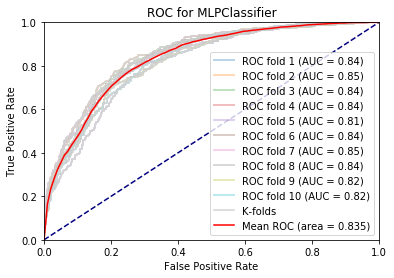

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=100, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


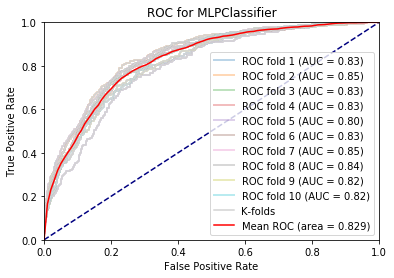

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=1000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


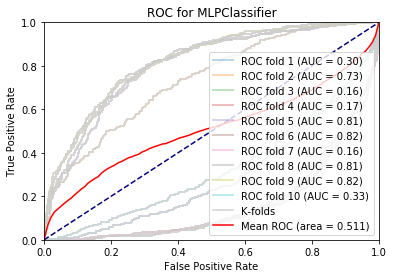

with_new_feature standardScalar pca MLPClassifier(activation='relu', alpha=10000, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


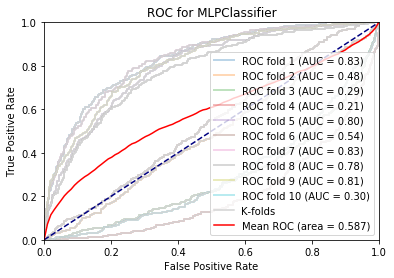

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


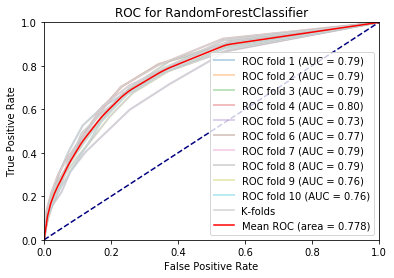

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


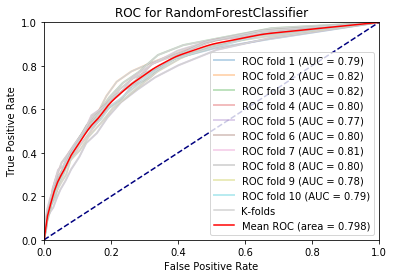

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


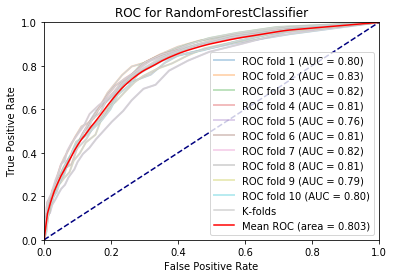

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


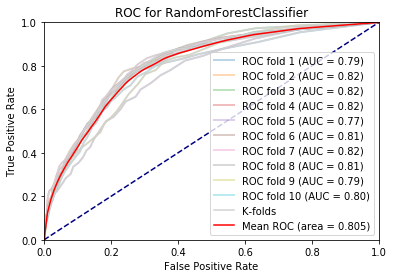

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


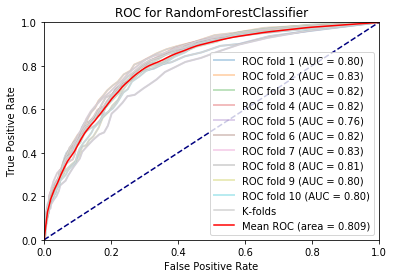

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


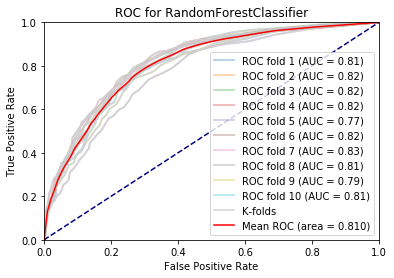

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


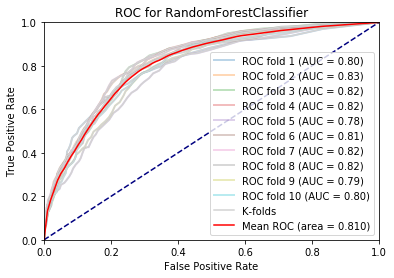

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=80,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


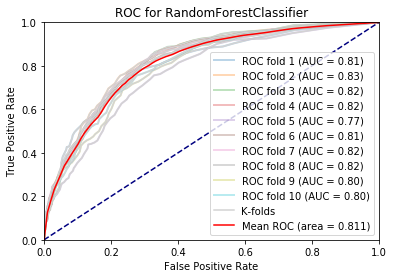

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


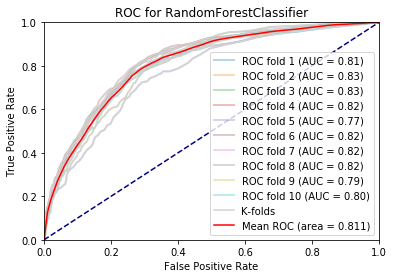

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


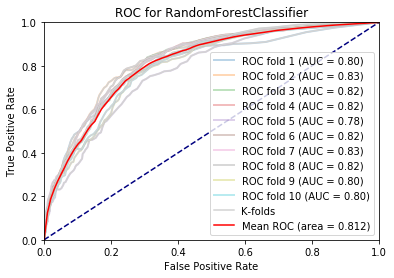

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=110,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


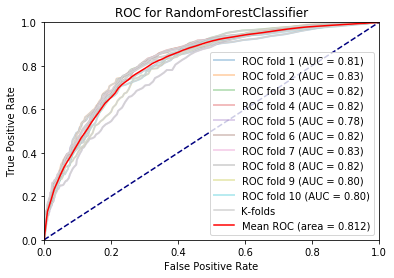

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=120,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


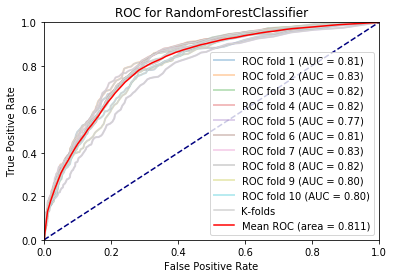

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


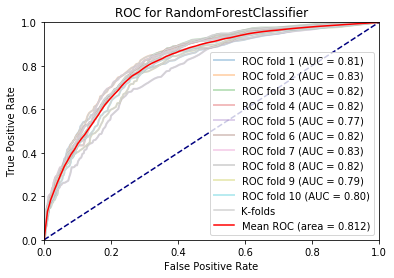

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=140,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


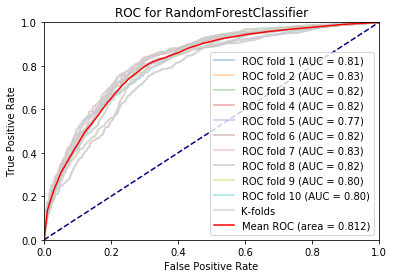

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


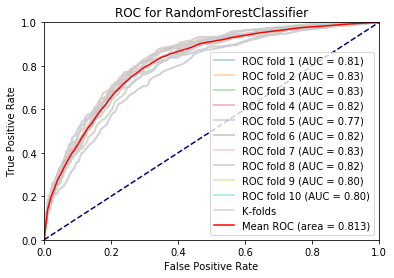

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=160,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


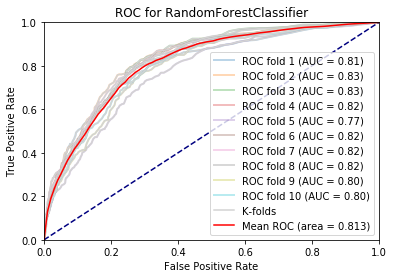

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


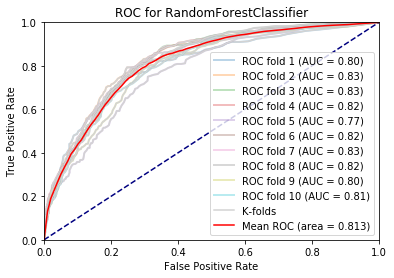

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=180,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


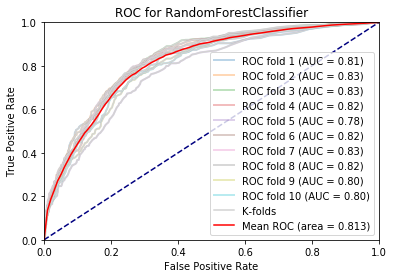

with_new_feature standardScalar pca RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


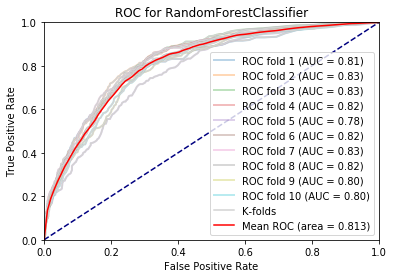

We got the best result (auc = 0.9005702071990125 ) with  with_new_feature standardScalar SelectKBest MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)


In [58]:
best_ever = [0,"nothing"]

def try_model(X, y, clf, k, name, confusion):
    s = name+str(clf)
    print(s)
    auc = KfoldPlot(X, y, clf, k, confusion) 
    if auc > best_ever[0]:
        best_ever[0] = auc
        best_ever[1] = s

cs = np.logspace(0, 4, 10)
powers = range(-1,5)
alphas =[10**(p) for p in powers]
n_estimators = range(10, 200, 10)
k = 10
confusion = True
for i in range(len(Xs_new)):
    X = Xs_new[i]
    name = names[i]
    for c in cs:
        log_clf = LogisticRegression(C=c, solver='lbfgs')
        try_model(X, y, log_clf, k, name, confusion) 
        confusion = False
    ga_clf = GaussianNB()
    try_model(X, y, ga_clf, k, name, confusion)
    for alpha in alphas:
        ann_clf = MLPClassifier(alpha=alpha)
        try_model(X, y, ann_clf, k, name, confusion)
    for n in n_estimators:
        deg_clf = RandomForestClassifier(n_estimators=n)
        try_model(X, y, deg_clf, k, name, confusion)
print("We got the best result (auc =",best_ever[0],") with ", best_ever[1])

> The example confusion matrix heatmap with the logistic regression model shows us that:  
* **1181** of them were ***correctly*** classified as ***No***.
* **59** were ***wrongly*** classified as ***Yes***.
* **147** were ***wrongly*** classified as ***No***
* **186** were ***correctly*** classified as ***Yes***.

> ***! Warning***: Each time we run this notebook, the number will be different with the number mentioned above.

Let's ***split*** our dataset into **train set** and **test set**, this time with **`train_test_split`**. We will use the x that turned out as the best.

In [59]:
X_train, X_test, y_train, y_test = train_test_split(Xs_new[3], y, stratify = y, test_size=0.2, random_state=5)

> Here, we keep **20%** of the dataset for testing by assigning **`test_size=0.2`**, the **`random_state`** is set to 5 to guarantee that each time we run the code, the same sequences of random number are generated. 

> Remember that when we inspect the target variable **`label`**, there is a big gap between the number of observations of 2 classes. Therefore, the dataset will be split using **stratified sampling** method by setting the parameter **`stratify = y`** to ensure the data is representative.

Let's create a Multi-Layer Perceptron (ANN) model with the chosen hyper parameters

In [60]:
clf = MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [61]:
clf.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [62]:
y_pred = clf.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.871900826446281


> Here, we will use the **`accuracy`** score to see how accurately the model can predict on the **test set** when trained on the **train set**. 

> As displayed, the **Multi-Layer Perceptron (ANN)** can predict whether it rains tomorrow or not with the accuracy of ***87.19%***

Let's check with the result on train set to see if it is overfitting.

In [63]:
print("Test score:", clf.score(X_test, y_test))
print("Train score:", clf.score(X_train, y_train))

Test score: 0.871900826446281
Train score: 0.8788649550910103


> The scores on both training set and test set are **roughly the same**, which mean that this model **generalises well** with ***unseen data***.

Let's calculate the **precision** and **recall** score for this model. In this case, the "**No**" will be **negative** class while "**Yes**" will be our **positive** class.

We will use the **`classification_report`** from **`sklearn.metrics`** library

In [64]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      2447
           1       0.78      0.59      0.67       699

    accuracy                           0.87      3146
   macro avg       0.84      0.77      0.80      3146
weighted avg       0.87      0.87      0.87      3146



> We can see that the this model is better at predicting if there is no rain tomorrow since the scores for ***class 0*** are **higher** than ***class 1***.

> Base on the situation we should ask for a high precision or recall score. We want to ***minimize the FP***, which leads to higher **precision score**.

**Things I tried but didn't end up using:**

**I removed the most of them but left some because you mentioned it in the instructions.**

**Anyway, it is not part of the final work flow!**

In [65]:
# number of trees in random forest
#n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 10)]
# number of features at every split
#max_features = ['auto', 'sqrt']
# max depth
#max_depth = [int(x) for x in np.linspace(100, 500, num = 11)]
#max_depth.append(None)
#max_auc = 0
#max_n = 0
#max_f = 0
#max_d = 0
#for n in n_estimators:
#    for d in max_depth:
#        for f in max_features:
#clf = RandomForestClassifier(n_estimators=n, max_depth=d, max_features=f)
#            clf.fit(best_x_train, best_y_train)
#            y_prob = clf.predict_proba(best_x_test)[:,1]
#            fpr, tpr, thresholds = roc_curve(best_y_test, y_prob)
#            a = auc(fpr, tpr)
#            if a > max_auc:
#                max_auc = a
#                max_n = n
#                max_f = f
#                max_d = d
#print ("the best hyper parameters values with respect to AUC measure: n = ",max_n,"f = ",max_f,"d = ",max_d," with an AUC of ",max_auc)

In [66]:
#from sklearn.model_selection import GridSearchCV
#from sklearn.model_selection import StratifiedKFold
#n_estimators = range(10, 200, 10)
#param_grid = dict(n_estimators=n_estimators)
#kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=5)
#grid_search = GridSearchCV(deg, param_grid, scoring="roc_auc", n_jobs=-1, cv=kfold)
#grid_result = grid_search.fit(best_x_train, best_y_train)
#print('Best score:', grid_result.best_score_)
#print('Best parameter:', grid_result.best_params_)
#print('Best estimator:', grid_result.best_estimator_)
#best_model = grid_result.best_estimator_
#print("Test score:", best_model.score(best_x_test, best_y_test))
#print('Train score:', best_model.score(best_x_train, best_y_train))

In [67]:
#powers = range(-2,4)
#Gs = [10**p for p in powers]
#powers = range(-10,0)
#Cs = [10**p for p in powers] #This is the inverse value for the lambda parameter.
#It bounds the total value of the norm, and directly reduces the hypothesis class

#l = [[x_scaled_with_new_feature, y_with_new_feature],[x_scaled, y]]
#for i in range(len(l)):
#    x = l[i][0]
#    y = l[i][1]
#    if i == 0:
#        name = " with new feature"
#    else:
#        name = " with pca"
#    reg = LogisticRegression(penalty='l2',dual=False,tol=0.0001,C=1,fit_intercept=True,intercept_scaling=1, class_weight=None,random_state=None,solver='liblinear',max_iter=100, multi_class='auto',verbose=0,warm_start=False,n_jobs=None,l1_ratio=None)
    #reg.fit(x, y)
    #print(name, "logistic regression score:", reg.score(x, y))
#    KfoldPlot(x, y, reg, 10, "logistic regression"+name)
#    ga = GaussianNB(priors=None, var_smoothing=1e-09)
    #KfoldPlot(x, y, ga, 10, "naive bayes"+name)
    #for g in Gs:
        # fit the model, don't regularize for illustration purposes
        #abc = svm.SVC(kernel='rbf', C = 1, gamma=g)
 #   abc = svm.SVC(kernel='rbf', C = 1, gamma='scale')
    #KfoldPlot(x, y, abc, 10, "svm"+name)
    #   abc.fit(X_train_set, y_train_set)
    #    print(name, "svm score with g=", g, ":", abc.score(X_valid_set, y_valid_set))
  #  deg = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None)
    #KfoldPlot(x, y, deg, 10, "random forest"+name)

In [68]:
#lg_model = LogisticRegression(penalty = 'l2', random_state = 5)
#lg_model.fit(X_train, y_train)

In [69]:
#y_pred_lg = lg_model.predict(X_test)
#print(accuracy_score(y_test, y_pred_lg))

In [70]:
#print("Test score:", lg_model.score(X_test, y_test))
#print("Train score:", lg_model.score(X_train, y_train))

In [71]:
#print(classification_report(y_test, y_pred_lg))

## **IV. Unseen Data**

**Read data**

In [72]:
#read from test file
unseen_data = pd.read_csv("test_without_target.csv")

### ***1. Unseen Data Exploration***

In [73]:
unseen_data.head()

,Unnamed: 0,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,...,Sunshine,Feature_16,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24
0,0,2.290494,12.400325,2.6,67.0,97.0,F,a11,1.600000,0.650000,...,105.0,21.5,12.2,F,H,52.0,33.0,2012,70.0,35.274812
1,1,2.094266,14.889448,3.6,72.0,78.0,M,a18,1.942857,1.328571,...,34.0,25.0,24.3,P,D,24.0,11.0,2012,40.0,56.066888
2,2,2.447235,20.596992,5.4,64.0,53.0,A,a20,1.864286,0.992857,...,102.0,23.7,22.8,C,O,39.0,31.0,2011,70.0,265.028249
3,3,2.669590,22.316415,5.8,20.0,71.0,N,a18,2.457143,1.257143,...,124.0,33.7,26.0,N,I,35.0,13.0,2012,60.0,96.102525
4,4,2.416996,18.936327,4.8,44.0,42.0,F,a3,1.285714,0.892857,...,84.0,16.1,15.4,M,M,43.0,20.0,2012,200.0,26.541954


In [74]:
print(unseen_data.columns)
print(len(unseen_data.columns))
unseen_data.head().shape

Index(['Unnamed: 0', 'Feature_0', 'Feature_1', 'Evaporation', 'Feature_3',
       'Feature_4', 'Feature_5', 'Feature_6', 'MaxTemp', 'Feature_8',
       'Feature_9', 'Feature_10', 'Feature_11', 'Feature_12', 'Feature_13',
       'Feature_14', 'Sunshine', 'Feature_16', 'Feature_17', 'Feature_18',
       'Feature_19', 'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23',
       'Feature_24'],
      dtype='object')
26


(5, 26)

In [75]:
unseen_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7387 entries, 0 to 7386
Data columns (total 26 columns):
Unnamed: 0       7387 non-null int64
Feature_0        7387 non-null float64
Feature_1        7387 non-null float64
Evaporation      7387 non-null float64
Feature_3        7362 non-null float64
Feature_4        7355 non-null float64
Feature_5        6964 non-null object
Feature_6        7387 non-null object
MaxTemp          7384 non-null float64
Feature_8        7382 non-null float64
Feature_9        7387 non-null int64
Feature_10       7387 non-null float64
Feature_11       7346 non-null float64
Feature_12       7347 non-null float64
Feature_13       7387 non-null object
Feature_14       7387 non-null object
Sunshine         6760 non-null float64
Feature_16       7373 non-null float64
Feature_17       7373 non-null float64
Feature_18       7314 non-null object
Feature_19       7031 non-null object
WindGustSpeed    6964 non-null float64
Feature_21       7356 non-null float64
Year  

### ***2. Unseen Data Preprocessing and Preparation***

In this part, we will apply on the test set all the preprocessing we applied on the train set:

1.   **Replace non-numerical characters from numerical columns**
2.   **Replcace NULL values with mean values in numerical columns**
3.   **Replcace NULL values with most common values in categorical columns**
4.   **Drop very correlated columns: Feature_1 and Feature_11**
5.   **Add Season column and drop Feature_9 column**
6.   **Transform categorical values into numeric ones**
7.   **Feature selection**
8.   **Feature scaling**

Notice, we won't remove outliers because we can't remove lines from the test set

**Replace non-numerical characters from numerical columns**

In [76]:
unseen_data['Feature_6'] = unseen_data['Feature_6'].str.replace(r'[^0-9]+', '')
unseen_data['Feature_14'] = unseen_data['Feature_14'].str.replace(r'[^0-9]+', '')
unseen_data.head()

,Unnamed: 0,Feature_0,Feature_1,Evaporation,Feature_3,Feature_4,Feature_5,Feature_6,MaxTemp,Feature_8,...,Sunshine,Feature_16,Feature_17,Feature_18,Feature_19,WindGustSpeed,Feature_21,Year,Feature_23,Feature_24
0,0,2.290494,12.400325,2.6,67.0,97.0,F,11,1.600000,0.650000,...,105.0,21.5,12.2,F,H,52.0,33.0,2012,70.0,35.274812
1,1,2.094266,14.889448,3.6,72.0,78.0,M,18,1.942857,1.328571,...,34.0,25.0,24.3,P,D,24.0,11.0,2012,40.0,56.066888
2,2,2.447235,20.596992,5.4,64.0,53.0,A,20,1.864286,0.992857,...,102.0,23.7,22.8,C,O,39.0,31.0,2011,70.0,265.028249
3,3,2.669590,22.316415,5.8,20.0,71.0,N,18,2.457143,1.257143,...,124.0,33.7,26.0,N,I,35.0,13.0,2012,60.0,96.102525
4,4,2.416996,18.936327,4.8,44.0,42.0,F,3,1.285714,0.892857,...,84.0,16.1,15.4,M,M,43.0,20.0,2012,200.0,26.541954


In [77]:
# List of categorical variables
cat = [i for i in unseen_data.columns if unseen_data[i].dtypes == 'O']
# List of numerical variables
num = [i for i in unseen_data.columns if i not in cat]
print('categorical:', cat, '\n', 'numerical: ', num)

categorical: ['Feature_5', 'Feature_6', 'Feature_13', 'Feature_14', 'Feature_18', 'Feature_19'] 
 numerical:  ['Unnamed: 0', 'Feature_0', 'Feature_1', 'Evaporation', 'Feature_3', 'Feature_4', 'MaxTemp', 'Feature_8', 'Feature_9', 'Feature_10', 'Feature_11', 'Feature_12', 'Sunshine', 'Feature_16', 'Feature_17', 'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23', 'Feature_24']


In [78]:
unseen_data[num].isnull().sum()

Unnamed: 0         0
Feature_0          0
Feature_1          0
Evaporation        0
Feature_3         25
Feature_4         32
MaxTemp            3
Feature_8          5
Feature_9          0
Feature_10         0
Feature_11        41
Feature_12        40
Sunshine         627
Feature_16        14
Feature_17        14
WindGustSpeed    423
Feature_21        31
Year               0
Feature_23        29
Feature_24        29
dtype: int64

In [79]:
unseen_data[cat].isnull().sum()

Feature_5     423
Feature_6       0
Feature_13      0
Feature_14      0
Feature_18     73
Feature_19    356
dtype: int64

**Replcace NULL values with mean values in numerical columns and with most common values in categorical columns**

In [80]:
unseen_data.loc[:, num] = unseen_data.loc[:, num].fillna(unseen_data.mean())
unseen_data.loc[:, cat] = unseen_data.loc[:, cat].fillna(unseen_data.mode().iloc[0])
unseen_data.isnull().sum()

Unnamed: 0       0
Feature_0        0
Feature_1        0
Evaporation      0
Feature_3        0
Feature_4        0
Feature_5        0
Feature_6        0
MaxTemp          0
Feature_8        0
Feature_9        0
Feature_10       0
Feature_11       0
Feature_12       0
Feature_13       0
Feature_14       0
Sunshine         0
Feature_16       0
Feature_17       0
Feature_18       0
Feature_19       0
WindGustSpeed    0
Feature_21       0
Year             0
Feature_23       0
Feature_24       0
dtype: int64

**Drop very correlated columns, add Season column and drop Feature_9 column**

In [81]:
unseen_data.drop(labels='Feature_1', axis = 1, inplace= True)
unseen_data.drop(labels='Feature_11', axis = 1, inplace= True)
unseen_data['Season'] = unseen_data['Feature_9'].replace((1,2,3,4,5,6,7,8,9,10,11,12), ('Winter', 'Winter', 'Spring', 'Spring', 'Spring', 'Summer', 'Summer', 'Summer', 'Autumn', 'Autumn', 'Autumn', 'Winter'))
unseen_data.drop(labels='Feature_9', axis = 1, inplace = True)
unseen_data.columns

Index(['Unnamed: 0', 'Feature_0', 'Evaporation', 'Feature_3', 'Feature_4',
       'Feature_5', 'Feature_6', 'MaxTemp', 'Feature_8', 'Feature_10',
       'Feature_12', 'Feature_13', 'Feature_14', 'Sunshine', 'Feature_16',
       'Feature_17', 'Feature_18', 'Feature_19', 'WindGustSpeed', 'Feature_21',
       'Year', 'Feature_23', 'Feature_24', 'Season'],
      dtype='object')

In [82]:
# List of categorical variables
cat = [i for i in unseen_data.columns if unseen_data[i].dtypes == 'O']
# List of numerical variables
num = [i for i in unseen_data.columns if i not in cat]
print('categorical:', cat, '\n', 'numerical: ', num)

categorical: ['Feature_5', 'Feature_6', 'Feature_13', 'Feature_14', 'Feature_18', 'Feature_19', 'Season'] 
 numerical:  ['Unnamed: 0', 'Feature_0', 'Evaporation', 'Feature_3', 'Feature_4', 'MaxTemp', 'Feature_8', 'Feature_10', 'Feature_12', 'Sunshine', 'Feature_16', 'Feature_17', 'WindGustSpeed', 'Feature_21', 'Year', 'Feature_23', 'Feature_24']


**Transform categorical values into numeric ones**

In [83]:
lb_encoder = LabelEncoder()
#After calling the function, we will fit and transform the target labels.
for i in unseen_data[cat].columns:
  unseen_data[i] = lb_encoder.fit_transform(unseen_data[i])
#print the result after transformation
for i in unseen_data[cat]:
  print(i, ':', unseen_data[i].unique())

Feature_5 : [ 5 12  0 13 10 15 11  6  1 14  8  2  3  4  9  7]
Feature_6 : [ 3 10 13 23 22 26 15 11  8 16  6  5 30 19  4 20 28 12  9 17 24  7 21 18
  0 27 14 29 25  1  2]
Feature_13 : [0 1 2]
Feature_14 : [  3   1  50 206 182   5 154  26  24  68  90  35 118 220 161 201 156  49
 197  57 218 110 179 205   8 165 133   7 128 142  51  22  89  23  12 221
  80  46 224  81  53  31  99 222  14  30   9 202  21 174  40 170  19  58
  13 148  44 194 176 108 185  41 181 203 191 209 215 169  37 114 125  39
  87  18  34  66  11 145  48  47 111  36 104  29  54  79 204 147 143   0
 213  88 186  64  43  55  74  27  59 214  77  65 192  10 199  60 105  56
  97  70  76  42  28  91 178  52 131 136 129 200 210  67  62  16 106  93
 219 134  98 150 146 211 180  45 183 163 121  32 115  83  82 130 162  38
 100 144 127 124 117 188 168  20 120 159 122  69  61 190  71 173 158 164
  92 109 139 103 189 187 184 149  75 223  84  17  63  33  78 137 193 196
 207 216 126   2  72  96   6 119 198 217 172 132 140 212 101 107 1

**Featue Selection**

In [84]:
k = k_best.get_support()
l = []
for i in range(len(k)):
    print(unseen_data.columns[i+1],k[i])
    if k[i] == False:
        l.append(unseen_data.columns[i+1])
print(l)
for i in l:
    unseen_data.drop(labels=i, axis = 1, inplace= True)
unseen_data.columns

Feature_0 False
Evaporation False
Feature_3 True
Feature_4 True
Feature_5 False
Feature_6 False
MaxTemp False
Feature_8 True
Feature_10 True
Feature_12 True
Feature_13 True
Feature_14 True
Sunshine True
Feature_16 True
Feature_17 False
Feature_18 False
Feature_19 False
WindGustSpeed True
Feature_21 False
Year False
Feature_23 False
Feature_24 False
Season False
['Feature_0', 'Evaporation', 'Feature_5', 'Feature_6', 'MaxTemp', 'Feature_17', 'Feature_18', 'Feature_19', 'Feature_21', 'Year', 'Feature_23', 'Feature_24', 'Season']


Index(['Unnamed: 0', 'Feature_3', 'Feature_4', 'Feature_8', 'Feature_10',
       'Feature_12', 'Feature_13', 'Feature_14', 'Sunshine', 'Feature_16',
       'WindGustSpeed'],
      dtype='object')

**Feature Scaling**

In [85]:
id = unseen_data['Unnamed: 0']
input_var = [i for i in unseen_data.columns if i != 'Unnamed: 0']

scaler = StandardScaler()
unseen_data[input_var] = scaler.fit_transform(unseen_data[input_var])

x_unseen_data = unseen_data[input_var]

In [86]:
unseen_data_x = pd.DataFrame(data = unseen_data)
unseen_data_x.columns

Index(['Unnamed: 0', 'Feature_3', 'Feature_4', 'Feature_8', 'Feature_10',
       'Feature_12', 'Feature_13', 'Feature_14', 'Sunshine', 'Feature_16',
       'WindGustSpeed'],
      dtype='object')

### ***3. Final Model Training and Fitting***

In [87]:
final_clf = MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)
final_clf.fit(Xs_new[3],y)

MLPClassifier(activation='relu', alpha=0.1, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

### ***4. Final Prediction***

In [88]:
test_probs = final_clf.predict_proba(x_unseen_data)

In [89]:
(test_probs[:,1] > 0.5).sum()

1187

In [90]:
# Create a submission
submission = pd.DataFrame({"":id,
                       "pred_proba":test_probs[:,1]})

# Save submission to CSV
submission.to_csv("Submission_group_number.csv", 
              index=False) 